# Importing Libraries

In [162]:
import numpy as np
import pandas as pd
import gc
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('fivethirtyeight') 
%matplotlib inline
import seaborn as sns

# import librosa for analysing audio signals : visualize audio, display the spectogram
import librosa
import soundfile as sf
import librosa.display

# import wav for reading and writing wav files
import wave

# import IPython.dispaly for playing audio in Jupter notebook
import IPython.display as ipd

import os
import random
import sklearn
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import log_loss
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold, learning_curve,StratifiedShuffleSplit

# Import PyTorch libraries
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchsummary import summary
from torchview import draw_graph

from pathlib import Path
import torchaudio
print("Libraries imported - ready to use PyTorch", torch.__version__)

# import tqdm to show a smart progress meter
from tqdm.notebook import trange,tqdm

# import warnings to hide the unnessairy warniings
import warnings
warnings.filterwarnings('ignore')

Libraries imported - ready to use PyTorch 2.1.1+cu121


In [163]:
import random 
SEED = 42
def seed_everything(seed=42): 
    random.seed(seed) 
    os.environ['PYTHONHASHSEED'] = str(seed) 
    np.random.seed(seed) 
seed_everything(SEED)

# Loading the Data

In [164]:
data = 'archive/audio/audio/44100/'
dataset = pd.read_csv('archive/esc50.csv')

In [165]:
all_files = []
for path, subdirs, files in os.walk(data):
    for name in files:
        all_files.append(os.path.join(path, name))

In [166]:
print(f"Number of audio files: {len(all_files)}")
print(all_files[0])
print(type(all_files[0]))

Number of audio files: 2000
archive/audio/audio/44100/1-100032-A-0.wav
<class 'str'>


In [167]:
# A dictionary to decode the categories into targets
decoder = {0: 'dog', 14: 'chirping_birds', 36: 'vacuum_cleaner', 19: 'thunderstorm', 30: 'door_wood_knock',34: 'can_opening', 9: 'crow', 22: 'clapping', 48: 'fireworks', 41: 'chainsaw', 47: 'airplane', 31: 'mouse_click', 17: 'pouring_water', 45: 'train', 8: 'sheep', 15: 'water_drops', 46: 'church_bells', 37: 'clock_alarm', 32: 'keyboard_typing', 16: 'wind', 25: 'footsteps', 4: 'frog', 3: 'cow', 27: 'brushing_teeth', 43: 'car_horn', 12: 'crackling_fire', 40: 'helicopter', 29: 'drinking_sipping', 10: 'rain', 7: 'insects', 26: 'laughing', 6: 'hen', 44: 'engine', 23: 'breathing', 20: 'crying_baby', 49: 'hand_saw', 24: 'coughing', 39: 'glass_breaking', 28: 'snoring', 18: 'toilet_flush', 2: 'pig', 35: 'washing_machine', 38: 'clock_tick', 21: 'sneezing', 1: 'rooster', 11: 'sea_waves', 42: 'siren', 5: 'cat', 33: 'door_wood_creaks', 13: 'crickets'}

# A dictionary to encode the categories into targets
encoder = {'dog': 0, 'chirping_birds': 14, 'vacuum_cleaner': 36, 'thunderstorm': 19, 'door_wood_knock': 30, 'can_opening': 34, 'crow': 9, 'clapping': 22, 'fireworks': 48, 'chainsaw': 41, 'airplane': 47, 'mouse_click': 31, 'pouring_water': 17, 'train': 45, 'sheep': 8, 'water_drops': 15, 'church_bells': 46, 'clock_alarm': 37, 'keyboard_typing': 32, 'wind': 16, 'footsteps': 25, 'frog': 4, 'cow': 3, 'brushing_teeth': 27, 'car_horn': 43, 'crackling_fire': 12, 'helicopter': 40, 'drinking_sipping': 29, 'rain': 10, 'insects': 7, 'laughing': 26, 'hen': 6, 'engine': 44, 'breathing': 23, 'crying_baby': 20, 'hand_saw': 49, 'coughing': 24, 'glass_breaking': 39, 'snoring': 28, 'toilet_flush': 18, 'pig': 2, 'washing_machine': 35, 'clock_tick': 38, 'sneezing': 21, 'rooster': 1, 'sea_waves': 11, 'siren': 42, 'cat': 5, 'door_wood_creaks': 33, 'crickets': 13}

In [168]:
final_class_names = ['Animals', 'Natural sounds', 'Human sounds', 'Interior sounds', 'Exterior noises']

final_class_decoder = {0: 'Animals', 1: 'Natural sounds', 2: 'Human sounds', 3: 'Interior sounds', 4: 'Exterior noises'}

final_class_encoder = {'Animals': 0, 'Natural sounds': 1, 'Human sounds': 2, 'Interior sounds': 3, 'Exterior noises': 4}

In [169]:
animals = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
Natural_sounds = [10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
Human_sounds = [20, 21, 22, 23, 24, 25, 26, 27, 28, 29]
Interior_sounds = [30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
Exterior_noises = [40, 41, 42, 43, 44, 45, 46, 47, 48, 49]

In [170]:
dataset.head()

,filename,fold,target,category,esc10,src_file,take
0,1-100032-A-0.wav,1,0,dog,True,100032,A
1,1-100038-A-14.wav,1,14,chirping_birds,False,100038,A
2,1-100210-A-36.wav,1,36,vacuum_cleaner,False,100210,A
3,1-100210-B-36.wav,1,36,vacuum_cleaner,False,100210,B
4,1-101296-A-19.wav,1,19,thunderstorm,False,101296,A


# Data Visualisation

## Loading Audio Files

In [10]:
plot_files = random.choices(all_files, k = 10)

In [11]:
print('Number of files to plot:', len(plot_files))
print('Printing the first file:', plot_files[0])
print('Printing the type of the first file:', type(plot_files[0]))

Number of files to plot: 10
Printing the first file: archive/audio/audio/44100/4-154443-A-24.wav
Printing the type of the first file: <class 'str'>


In [12]:
plot_audios = [librosa.load(plot_files[i]) for i in range(10)]

In [13]:
print('Number of audio files:', len(plot_audios))
print('Printing the first audio:', plot_audios[0])
print('Printing the type of the first audio:', type(plot_audios[0]))
print('Printing the shape of the first audio:', plot_audios[0][0].shape)

Number of audio files: 10
Printing the first audio: (array([0.01141017, 0.0153377 , 0.01150631, ..., 0.        , 0.        ,
       0.        ], dtype=float32), 22050)
Printing the type of the first audio: <class 'tuple'>
Printing the shape of the first audio: (110250,)


In [14]:
y, sr = librosa.load(data + "1-100032-A-0.wav")

print('y:', y)
print('y shape:', np.shape(y))
print('Sample Rate (KHz):', sr)

print('Duration of the audio file:', np.shape(y)[0]/sr, 'second')

y: [0. 0. 0. ... 0. 0. 0.]
y shape: (110250,)
Sample Rate (KHz): 22050
Duration of the audio file: 5.0 second


In [15]:
ipd.Audio(data + "1-100032-A-0.wav")

## Distribution of Categories

Text(0, 0.5, 'Number of Samples')

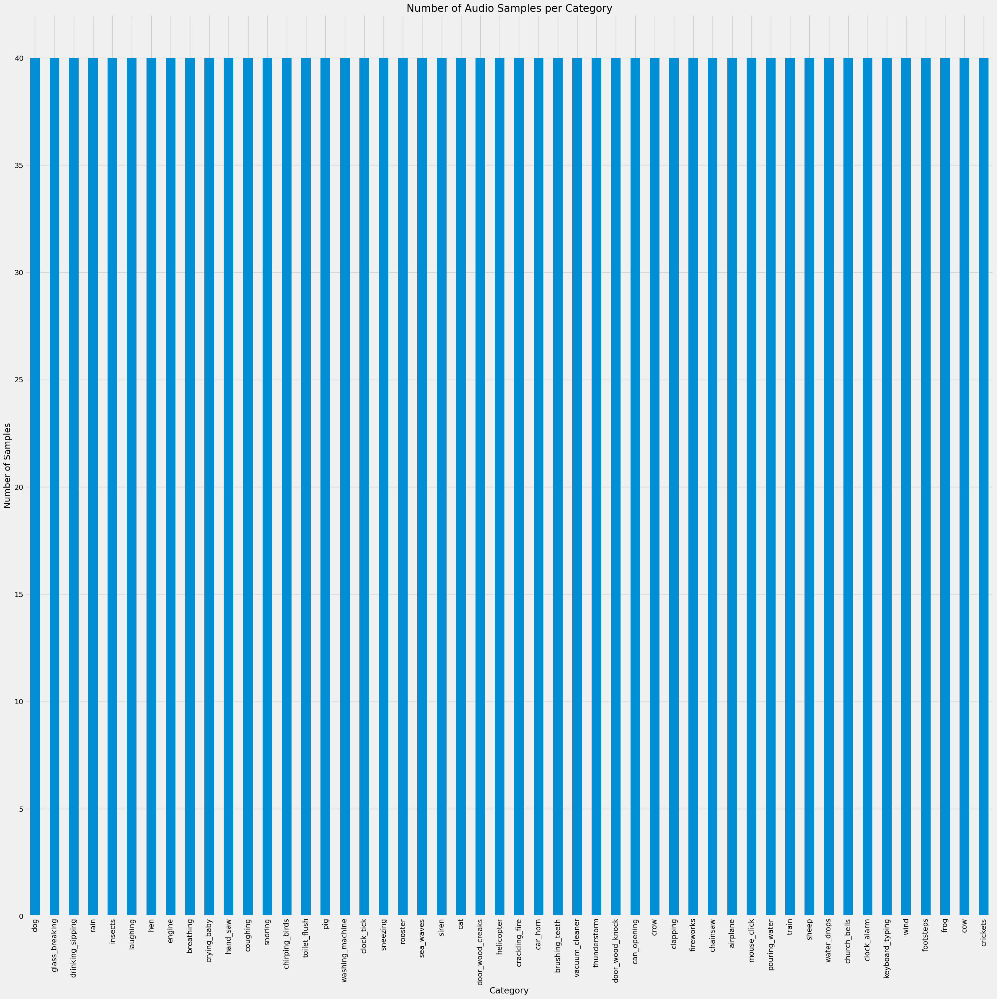

In [16]:
category_group = dataset['category'].value_counts()
plot = category_group.plot(kind='bar', title="Number of Audio Samples per Category", figsize=(30,30))
plot.set_xlabel("Category")
plot.set_ylabel("Number of Samples")

In [17]:
# make a new coloumn in the dataset called major category, and loop through the data frame to fill it

dataset['major_category'] = 'None'

for i in range(len(dataset)):
    if dataset['target'][i] in animals:
        dataset['major_category'][i] = 'Animals'
    elif dataset['target'][i] in Natural_sounds:
        dataset['major_category'][i] = 'Natural sounds'
    elif dataset['target'][i] in Human_sounds:
        dataset['major_category'][i] = 'Human sounds'
    elif dataset['target'][i] in Interior_sounds:
        dataset['major_category'][i] = 'Interior sounds'
    elif dataset['target'][i] in Exterior_noises:
        dataset['major_category'][i] = 'Exterior noises'

In [18]:
dataset['major_category'].value_counts()

Animals            400
Natural sounds     400
Interior sounds    400
Human sounds       400
Exterior noises    400
Name: major_category, dtype: int64

Text(0, 0.5, 'Number of Samples')

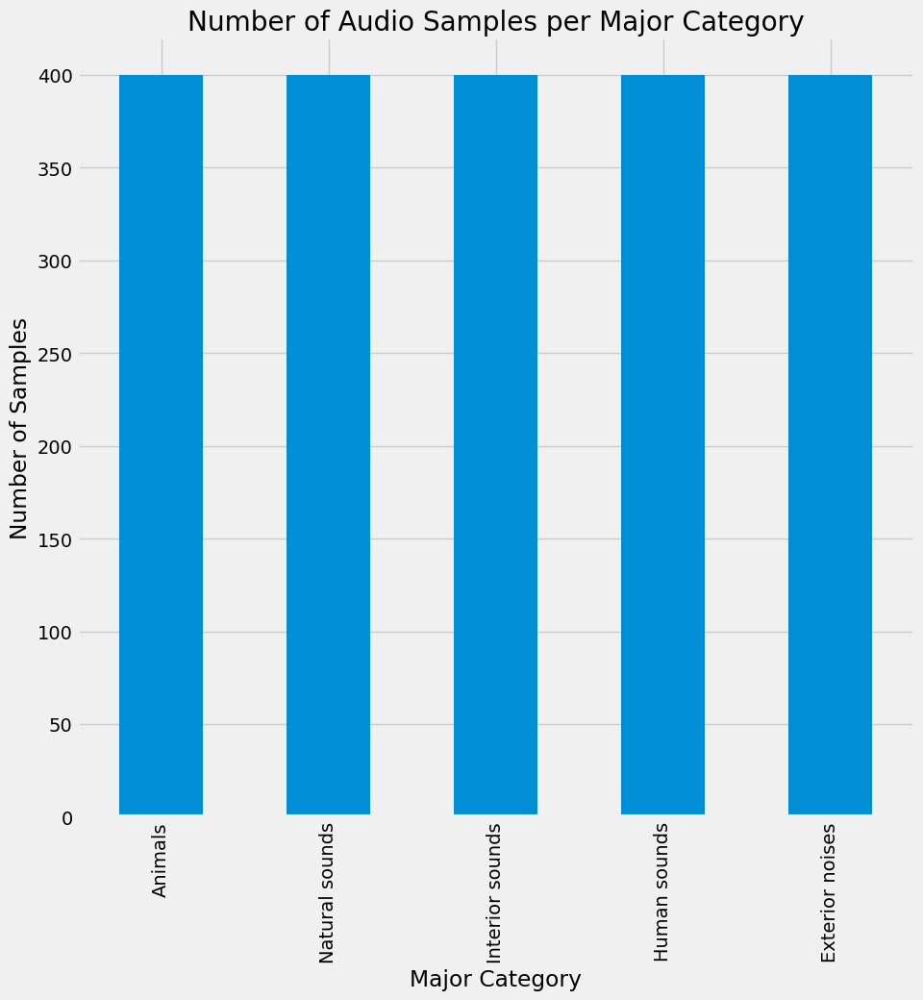

In [19]:
# plot the major categories
major_category_group = dataset['major_category'].value_counts()
plot = major_category_group.plot(kind='bar', title="Number of Audio Samples per Major Category", figsize=(10,10))
plot.set_xlabel("Major Category")
plot.set_ylabel("Number of Samples")

## Visualising using Audio Plots

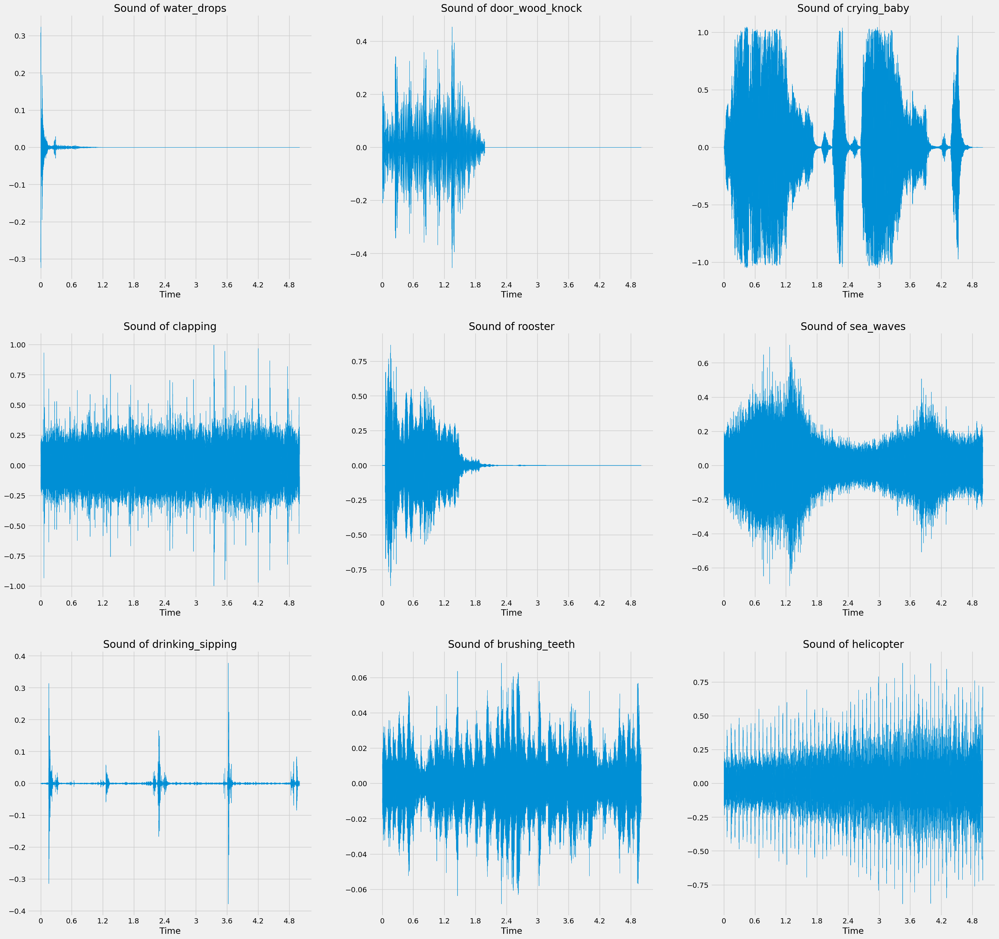

In [20]:
plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    librosa.display.waveshow(plot_audios[i][0])
    try:
        plt.title("Sound of " + decoder[int(plot_files[i][-6:-4])])
    except:
        plt.title("Sound of " + decoder[int(plot_files[i][-5:-4])])

## Visualising using Fourier Transform

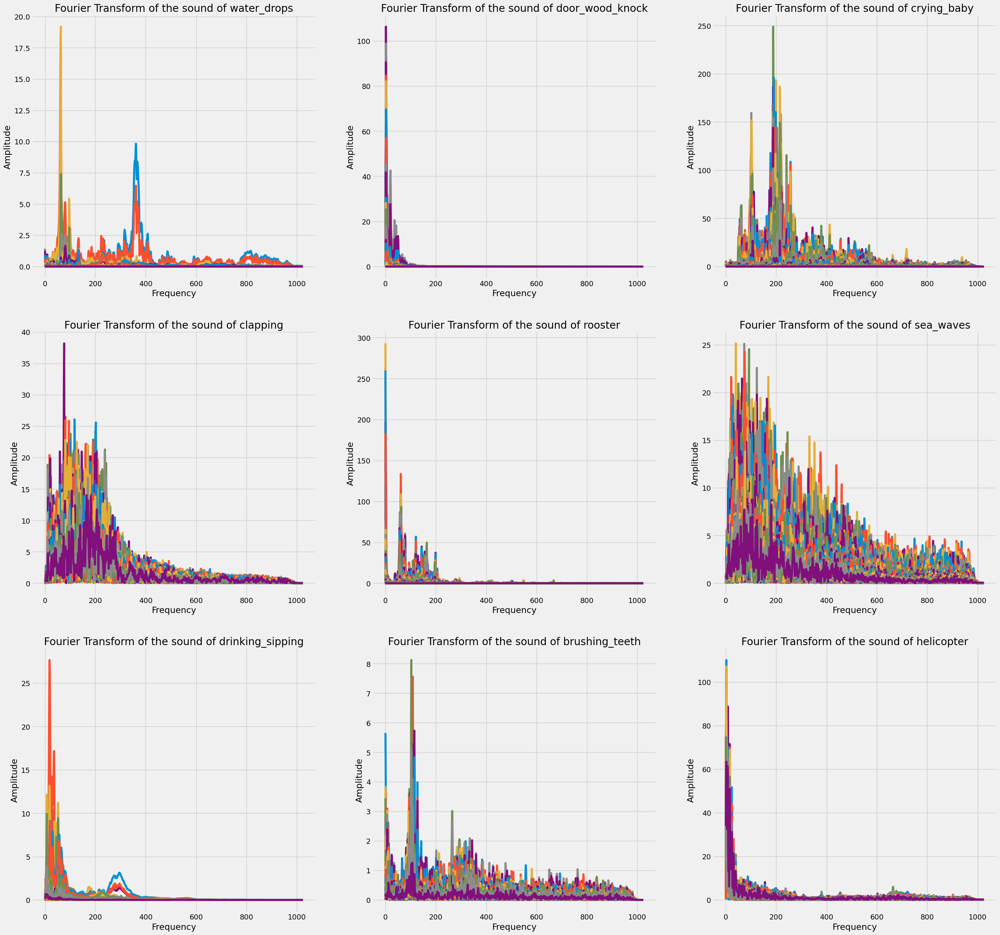

In [21]:
# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns 

plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    X = np.abs(librosa.stft(plot_audios[i][0], n_fft = n_fft, hop_length = hop_length))
    plt.plot(X)
    plt.xlabel("Frequency")
    plt.ylabel("Amplitude")
    try:
        plt.title("Fourier Transform of the sound of " + decoder[int(plot_files[i][-6:-4])])
    except:
        plt.title("Fourier Transform of the sound of " + decoder[int(plot_files[i][-5:-4])])

## Spectrogram

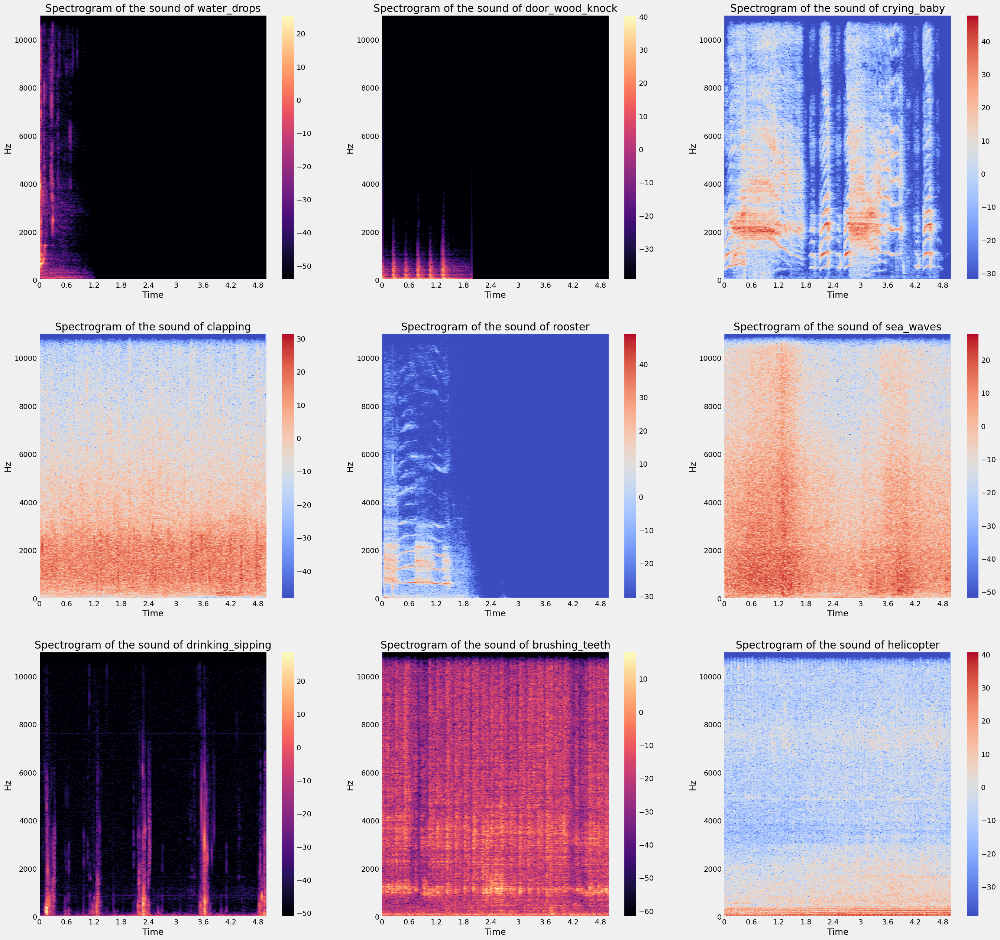

In [22]:
plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    X = librosa.stft(plot_audios[i][0])
    Xdb = librosa.amplitude_to_db(abs(X))
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
    plt.colorbar()
    try:
        plt.title("Spectrogram of the sound of " + decoder[int(plot_files[i][-6:-4])])
    except:
        plt.title("Spectrogram of the sound of " + decoder[int(plot_files[i][-5:-4])])

## Mel Spectrogram

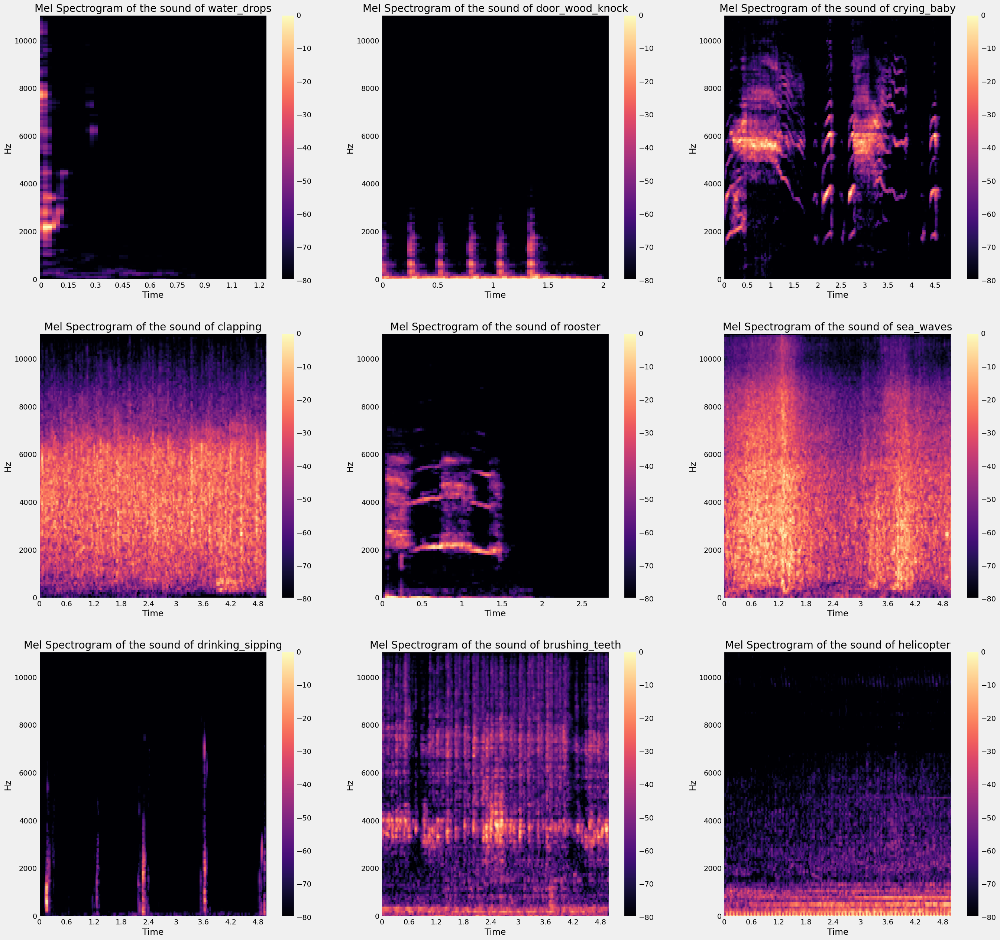

In [23]:
plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    X, _ = librosa.effects.trim(plot_audios[i][0])   # Trim the silence out in the beginning and end of the audio
    XS = librosa.feature.melspectrogram(y=X, sr=sr)
    Xdb = librosa.amplitude_to_db(XS, ref=np.max)
    librosa.display.specshow(Xdb, sr=plot_audios[i][1], x_axis='time', y_axis='hz')
    plt.colorbar()
    try:
        plt.title("Mel Spectrogram of the sound of " + decoder[int(plot_files[i][-6:-4])])
    except:
        plt.title("Mel Spectrogram of the sound of " + decoder[int(plot_files[i][-5:-4])])

# Dataset Building

## Log Mel Spectrogram

In [171]:
def visualize_log_mel_spect(mel_spectrogram_db,sample_rate,hop_length=320):
    librosa.display.specshow(mel_spectrogram_db, sr=sample_rate, x_axis='time', y_axis='mel',hop_length=hop_length)
    plt.colorbar(format='%+2.0f dB')
    plt.title('Log Mel spectrogram')
    plt.tight_layout()
    plt.show()

In [172]:
def compute_log_mel_spect(audio,sample_rate):  # Size of the Fast Fourier Transform (FFT), which will also be used as the window length
    n_fft=1024
    hop_length=512
    window_type ='hann'
    mel_bins = 60 # Number of mel bands
    normalized_y = librosa.util.normalize(audio)
    Mel_spectrogram = librosa.feature.melspectrogram(y=normalized_y, sr=22050,hop_length=hop_length, win_length=n_fft, n_mels = mel_bins)
    mel_spectrogram_db = librosa.power_to_db(Mel_spectrogram)
    return  mel_spectrogram_db

## Preparing Dataset for Training

In [173]:
data_final=[]

for i in tqdm(range(len(dataset))):
    wave_file=dataset.iat[i,0]
    wave_file=data+wave_file   # Final data path
    audio, sample_rate = librosa.load(wave_file)
    mel_spectrogram_db=(compute_log_mel_spect(audio,sample_rate))
    delta=librosa.feature.delta(mel_spectrogram_db)
    data_final.append(np.dstack((mel_spectrogram_db,delta)))

dataset['data']=data_final

  0%|          | 0/2000 [00:00<?, ?it/s]

In [174]:
print('Shape of the Mel Spectrogram:', dataset['data'][0].shape)

Shape of the Mel Spectrogram: (60, 216, 2)


In [175]:
# go through the dataset and replace the target labels with major category labels

for i in range(len(dataset)):
    dataset['target'][i] = final_class_encoder[dataset['major_category'][i]]

KeyError: 'major_category'

In [ ]:
dataset.head()

,filename,fold,target,category,esc10,src_file,take,major_category,data
0,1-100032-A-0.wav,1,0,dog,True,100032,A,Animals,"[[[-59.851242, -1.1860621e-15], [-59.851242, -..."
1,1-100038-A-14.wav,1,1,chirping_birds,False,100038,A,Natural sounds,"[[[-39.788612, -0.269498], [-45.22654, -0.2694..."
2,1-100210-A-36.wav,1,3,vacuum_cleaner,False,100210,A,Interior sounds,"[[[2.3729558, 0.4725407], [10.374783, 0.472540..."
3,1-100210-B-36.wav,1,3,vacuum_cleaner,False,100210,B,Interior sounds,"[[[19.905025, -1.2174983], [16.533371, -1.2174..."
4,1-101296-A-19.wav,1,1,thunderstorm,False,101296,A,Natural sounds,"[[[-12.586519, 1.2634252], [-8.0822935, 1.2634..."


In [ ]:
from torchvision.transforms import Resize
import torchaudio.transforms as T

X_dat = dataset.drop(columns=['filename','fold','target'])
y_dat = dataset.target

In [ ]:
# Initialize the StratifiedShuffleSplit object
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.15, random_state=42)

# Split the data into training and testing sets
for train_index, test_index in sss.split(X_dat, y_dat):
    train_df = dataset.iloc[train_index]
    test_df = dataset.iloc[test_index]

print("Size of the training set : ", train_df.shape)
print("Size of the testing set : ", test_df.shape)

Size of the training set :  (1700, 9)
Size of the testing set :  (300, 9)


In [ ]:
train_df = train_df[['data','target']]
test_df = test_df[['data','target']]

In [ ]:
print("Size of the training set : ", train_df.shape)
print("Size of the testing set : ", test_df.shape)

Size of the training set :  (1700, 2)
Size of the testing set :  (300, 2)


In [ ]:
train_df.head()

,data,target
1038,"[[[15.758181, -0.5101888], [22.63113, -0.51018...",1
1482,"[[[-49.280777, -2.1990026e-15], [-49.280777, -...",0
1758,"[[[2.3998003, -1.1255529], [-13.46211, -1.1255...",0
1920,"[[[-33.293625, -0.16783816], [-54.33751, -0.16...",1
1428,"[[[-18.931467, 0.70559466], [-18.883163, 0.705...",0


In [ ]:
test_df.head()

,data,target
546,"[[[-11.792498, 0.092255235], [-17.918518, 0.09...",3
1680,"[[[-4.9094315, -1.2387953], [4.9083467, -1.238...",4
481,"[[[5.7814865, 0.2392987], [8.981001, 0.2392987...",2
1262,"[[[-0.9601002, -0.2574105], [-4.107499, -0.257...",3
1711,"[[[-39.62947, 0.25106815], [-29.995787, 0.2510...",0


In [ ]:
train_df['target'].value_counts()

1    340
0    340
3    340
4    340
2    340
Name: target, dtype: int64

In [ ]:
test_df['target'].value_counts()

3    60
4    60
2    60
0    60
1    60
Name: target, dtype: int64

## Data Loader

In [ ]:
class escDataset(Dataset):
    def __init__(self,dataset, transformation, device):
        self.dataset = dataset
        self.device = device
        self.transformation = transformation
        self.length=len(self.dataset)

    def __len__(self):
        return self.length
    
    def __getitem__(self, index):
        spectogram = torch.tensor(self._get_audio_spectogram(index))
        label = self._get_audio_sample_label(index)    
        spectogram=spectogram.permute(2, 0, 1)    # spectrogram is 60, 216, 2, output will be 2, 60, 216
        resize_transform = Resize((60, 216))
        spectogram = resize_transform(spectogram)
        #spectogram  = spectogram.to(self.device)
        #spectogram  = self.transformation(spectogram)
        return spectogram, label
    def _get_audio_spectogram(self, index):
        y = self.dataset.iloc[index, 0].astype(np.float32)
        return y

    def _get_audio_sample_label(self, index):
        return self.dataset.iloc[index, 1]

In [ ]:
class MyReshape(object):
    
    def __init__(self, output_size):
        assert isinstance(output_size, (tuple))

        self.output_size = output_size
    def __call__(self, image):
        return image.reshape(self.output_size)

In [ ]:
# build transformation pipelines for data augmentation
#.compose() is used to combine multiple transformations

train_transforms = transforms.Compose([ MyReshape(output_size=(2,60, 216) ) ])
test_transforms = transforms.Compose([MyReshape(output_size=(2,60, 216))])

In [ ]:
batch_size = 50
device='cuda'

train_data = escDataset(train_df,train_transforms,device)
test_data = escDataset(test_df,train_transforms,device)

train_loader = DataLoader(train_data, batch_size=batch_size,shuffle=True)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=True)

# Convolutional Neural Networks (CNNs)

## Simple CNN

### Model 1 (3 layered Simple Vanilla CNN)

In [42]:
import torch.nn as nn
import torch.nn.functional as F

class SCNN_1(nn.Module):
    def __init__(self):
        super(SCNN_1, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=2, out_channels=16, kernel_size=(3,3), stride=(1,1), padding=0)
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(3,3), stride=(1,1), padding=0)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3,3), stride=(1,1), padding=0)
        # Max pooling layers
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Fully connected layers
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*5*25, 200),
            nn.ReLU(),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, x):

        # input size is 2, 60, 216
        x = F.relu(self.conv1(x))
        #print("After conv1:", x.shape)

        # input size is 16, 58, 214
        x = self.pool1(x)
        #print("After pool1:", x.shape)

        # input size is 16, 29, 107
        x = F.relu(self.conv2(x))
        #print("After conv2:", x.shape)

        # input size is 32, 27, 105
        x = self.pool2(x)
        #print("After pool2:", x.shape)

        # input size is 32, 13, 52
        x = F.relu(self.conv3(x))
        #print("After conv3:", x.shape)

        # input size is 64, 11, 50
        x = self.pool3(x)
        #print("After pool3:", x.shape)

        x = self.connected_layer(x)
        #print("After connected layer:", x.shape)
        
        return x

### Model 2 (with Padding)

In [43]:
import torch.nn as nn
import torch.nn.functional as F

class SCNN_2(nn.Module):
    def __init__(self):
        super(SCNN_2, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=2, out_channels=16, kernel_size=(3,3), stride=(1,1), padding=1)
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(3,3), stride=(1,1), padding=1)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3,3), stride=(1,1), padding=1)
        # Max pooling layers
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Fully connected layers
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*7*27, 200),
            nn.ReLU(),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, x):

        # input size is 2, 60, 216
        x = F.relu(self.conv1(x))
        #print("After conv1:", x.shape)

        # input size is 16, 58, 214
        x = self.pool1(x)
        #print("After pool1:", x.shape)

        # input size is 16, 29, 107
        x = F.relu(self.conv2(x))
        #print("After conv2:", x.shape)

        # input size is 32, 27, 105
        x = self.pool2(x)
        #print("After pool2:", x.shape)

        # input size is 32, 13, 52
        x = F.relu(self.conv3(x))
        #print("After conv3:", x.shape)

        # input size is 64, 11, 50
        x = self.pool3(x)
        #print("After pool3:", x.shape)

        # input size is 64, 7, 27
        x = self.connected_layer(x)
        #print("After connected layer:", x.shape)
        
        return x

In [44]:
scnn_1 = SCNN_1().cuda()
# input_data = torch.randn(64, 2,60,216)
# model_graph = draw_graph(scnn_1,input_data, roll=True)
# model_graph.visual_graph

### Model 3 (With Increased Kernel Size)

In [45]:
import torch.nn as nn
import torch.nn.functional as F

class SCNN_3(nn.Module):
    def __init__(self):
        super(SCNN_3, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=2, out_channels=16, kernel_size=(4,4), stride=(1,1), padding=0)
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(4,4), stride=(1,1), padding=0)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(4,4), stride=(1,1), padding=0)
        # Max pooling layers
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Fully connected layers
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*4*24, 200),
            nn.ReLU(),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, x):

        # input size is 2, 60, 216
        x = F.relu(self.conv1(x))
        #print("After conv1:", x.shape)

        # input size is 16, 58, 214
        x = self.pool1(x)
        #print("After pool1:", x.shape)

        # input size is 16, 29, 107
        x = F.relu(self.conv2(x))
        #print("After conv2:", x.shape)

        # input size is 32, 27, 105
        x = self.pool2(x)
        #print("After pool2:", x.shape)

        # input size is 32, 13, 52
        x = F.relu(self.conv3(x))
        #print("After conv3:", x.shape)

        # input size is 64, 11, 50
        x = self.pool3(x)
        #print("After pool3:", x.shape)

        x = self.connected_layer(x)
        #print("After connected layer:", x.shape)
        
        return x

### Model 4 (with Increased Row and Coloumn Stride)

In [46]:
import torch.nn as nn
import torch.nn.functional as F

class SCNN_4(nn.Module):
    def __init__(self):
        super(SCNN_4, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=2, out_channels=16, kernel_size=(3,3), stride=(2,2), padding=0)
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(3,3), stride=(2,2), padding=0)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3,3), stride=(2,2), padding=0)
        # Max pooling layers
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Fully connected layers
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*1*6, 200),
            nn.ReLU(),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, x):

        # input size is 2, 60, 216
        x = F.relu(self.conv1(x))
        #print("After conv1:", x.shape)

        # input size is 16, 58, 214
        x = self.pool1(x)
        #print("After pool1:", x.shape)

        # input size is 16, 29, 107
        x = F.relu(self.conv2(x))
        #print("After conv2:", x.shape)

        # input size is 32, 27, 105
        x = self.pool2(x)
        #print("After pool2:", x.shape)

        # input size is 32, 13, 52
        x = F.relu(self.conv3(x))
        #print("After conv3:", x.shape)

        x = self.connected_layer(x)
        #print("After connected layer:", x.shape)
        
        return x

### Model 5 (With Increased number of Filters)

In [47]:
import torch.nn as nn
import torch.nn.functional as F

class SCNN_5(nn.Module):
    def __init__(self):
        super(SCNN_5, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=2, out_channels=32, kernel_size=(3,3), stride=(1,1), padding=0)
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3,3), stride=(1,1), padding=0)
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=96, kernel_size=(3,3), stride=(1,1), padding=0)
        # Max pooling layers
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Fully connected layers
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(96*5*25, 200),
            nn.ReLU(),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, x):

        # input size is 2, 60, 216
        x = F.relu(self.conv1(x))
        #print("After conv1:", x.shape)

        # input size is 16, 58, 214
        x = self.pool1(x)
        #print("After pool1:", x.shape)

        # input size is 16, 29, 107
        x = F.relu(self.conv2(x))
        #print("After conv2:", x.shape)

        # input size is 32, 27, 105
        x = self.pool2(x)
        #print("After pool2:", x.shape)

        # input size is 32, 13, 52
        x = F.relu(self.conv3(x))
        #print("After conv3:", x.shape)

        # input size is 64, 11, 50
        x = self.pool3(x)
        #print("After pool3:", x.shape)

        x = self.connected_layer(x)
        #print("After connected layer:", x.shape)
        
        return x

### Model 6 (with Increased Kernel Size and Padding)

In [48]:
import torch.nn as nn
import torch.nn.functional as F

class SCNN_6(nn.Module):
    def __init__(self):
        super(SCNN_6, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=2, out_channels=16, kernel_size=(4,4), stride=(1,1), padding=1)
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(4,4), stride=(1,1), padding=1)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(4,4), stride=(1,1), padding=1)
        # Max pooling layers
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Fully connected layers
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*6*26, 200),
            nn.ReLU(),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, x):

        # input size is 2, 60, 216
        x = F.relu(self.conv1(x))
        #print("After conv1:", x.shape)

        # input size is 16, 58, 214
        x = self.pool1(x)
        #print("After pool1:", x.shape)

        # input size is 16, 29, 107
        x = F.relu(self.conv2(x))
        #print("After conv2:", x.shape)

        # input size is 32, 27, 105
        x = self.pool2(x)
        #print("After pool2:", x.shape)

        # input size is 32, 13, 52
        x = F.relu(self.conv3(x))
        #print("After conv3:", x.shape)

        # input size is 64, 11, 50
        x = self.pool3(x)
        #print("After pool3:", x.shape)

        x = self.connected_layer(x)
        #print("After connected layer:", x.shape)
        
        return x

### Model 7 (With Increased stride and Padding)

In [49]:
import torch.nn as nn
import torch.nn.functional as F

class SCNN_7(nn.Module):
    def __init__(self):
        super(SCNN_7, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=2, out_channels=16, kernel_size=(3,3), stride=(2,2), padding=1)
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(3,3), stride=(2,2), padding=1)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3,3), stride=(2,2), padding=1)
        # Max pooling layers
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Fully connected layers
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*1*3, 200),
            nn.ReLU(),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, x):

        # input size is 2, 60, 216
        x = F.relu(self.conv1(x))
        #print("After conv1:", x.shape)

        # input size is 16, 58, 214
        x = self.pool1(x)
        #print("After pool1:", x.shape)

        # input size is 16, 29, 107
        x = F.relu(self.conv2(x))
        #print("After conv2:", x.shape)

        # input size is 32, 27, 105
        x = self.pool2(x)
        #print("After pool2:", x.shape)

        # input size is 32, 13, 52
        x = F.relu(self.conv3(x))
        #print("After conv3:", x.shape)

        # input size is 64, 11, 50
        x = self.pool3(x)
        #print("After pool3:", x.shape)

        x = self.connected_layer(x)
        #print("After connected layer:", x.shape)
        
        return x

### Model 8 (with Increased Kernel size, Stride and Padding)

In [50]:
import torch.nn as nn
import torch.nn.functional as F

class SCNN_8(nn.Module):
    def __init__(self):
        super(SCNN_8, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=2, out_channels=16, kernel_size=(4,4), stride=(2,2), padding=1)
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(4,4), stride=(2,2), padding=1)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(4,4), stride=(2,2), padding=1)
        # Max pooling layers
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Fully connected layers
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*1*6, 200),
            nn.ReLU(),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, x):

        # input size is 2, 60, 216
        x = F.relu(self.conv1(x))
        #print("After conv1:", x.shape)

        # input size is 16, 58, 214
        x = self.pool1(x)
        #print("After pool1:", x.shape)

        # input size is 16, 29, 107
        x = F.relu(self.conv2(x))
        #print("After conv2:", x.shape)

        # input size is 32, 27, 105
        x = self.pool2(x)
        #print("After pool2:", x.shape)

        # input size is 32, 13, 52
        x = F.relu(self.conv3(x))
        #print("After conv3:", x.shape)

        x = self.connected_layer(x)
        #print("After connected layer:", x.shape)
        
        return x

### Model 9 (with Increased Row Stride)

In [51]:
import torch.nn as nn
import torch.nn.functional as F

class SCNN_9(nn.Module):
    def __init__(self):
        super(SCNN_9, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=2, out_channels=16, kernel_size=(3,3), stride=(2,1), padding=1)
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(3,3), stride=(2,1), padding=1)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3,3), stride=(2,1), padding=1)
        # Max pooling layers
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Fully connected layers
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*1*27, 200),
            nn.ReLU(),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, x):

        # input size is 2, 60, 216
        x = F.relu(self.conv1(x))
        #print("After conv1:", x.shape)

        # input size is 16, 58, 214
        x = self.pool1(x)
        #print("After pool1:", x.shape)

        # input size is 16, 29, 107
        x = F.relu(self.conv2(x))
        #print("After conv2:", x.shape)

        # input size is 32, 27, 105
        x = self.pool2(x)
        #print("After pool2:", x.shape)

        # input size is 32, 13, 52
        x = F.relu(self.conv3(x))
        #print("After conv3:", x.shape)

        # input size is 64, 11, 50
        x = self.pool3(x)
        #print("After pool3:", x.shape)

        x = self.connected_layer(x)
        #print("After connected layer:", x.shape)
        
        return x

### Model 10 (with Increased Coloumn Stride)

In [52]:
import torch.nn as nn
import torch.nn.functional as F

class SCNN_10(nn.Module):
    def __init__(self):
        super(SCNN_10, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=2, out_channels=16, kernel_size=(3,3), stride=(1,2), padding=1)
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(3,3), stride=(1,2), padding=1)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3,3), stride=(1,2), padding=1)
        # Max pooling layers
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Fully connected layers
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*7*3, 200),
            nn.ReLU(),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, x):

        # input size is 2, 60, 216
        x = F.relu(self.conv1(x))
        #print("After conv1:", x.shape)

        # input size is 16, 58, 214
        x = self.pool1(x)
        #print("After pool1:", x.shape)

        # input size is 16, 29, 107
        x = F.relu(self.conv2(x))
        #print("After conv2:", x.shape)

        # input size is 32, 27, 105
        x = self.pool2(x)
        #print("After pool2:", x.shape)

        # input size is 32, 13, 52
        x = F.relu(self.conv3(x))
        #print("After conv3:", x.shape)

        # input size is 64, 11, 50
        x = self.pool3(x)
        #print("After pool3:", x.shape)

        x = self.connected_layer(x)
        #print("After connected layer:", x.shape)
        
        return x

In [53]:
import torch.nn as nn
import torch.nn.functional as F

class SCNN_11(nn.Module):
    def __init__(self):
        super(SCNN_11, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=2, out_channels=16, kernel_size=(3,3), stride=(1,1), padding=1)
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(3,3), stride=(1,1), padding=1)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3,3), stride=(1,1), padding=1)
        # Max pooling layers
        self.pool1 = nn.MaxPool2d(kernel_size=3, stride=2)
        self.pool2 = nn.MaxPool2d(kernel_size=3, stride=2)
        self.pool3 = nn.MaxPool2d(kernel_size=3, stride=2)
        
        # Fully connected layers
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*6*26, 200),
            nn.ReLU(),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, x):

        # input size is 2, 60, 216
        x = F.relu(self.conv1(x))
        #print("After conv1:", x.shape)

        # input size is 16, 58, 214
        x = self.pool1(x)
        #print("After pool1:", x.shape)

        # input size is 16, 29, 107
        x = F.relu(self.conv2(x))
        #print("After conv2:", x.shape)

        # input size is 32, 27, 105
        x = self.pool2(x)
        #print("After pool2:", x.shape)

        # input size is 32, 13, 52
        x = F.relu(self.conv3(x))
        #print("After conv3:", x.shape)

        # input size is 64, 11, 50
        x = self.pool3(x)
        #print("After pool3:", x.shape)

        x = self.connected_layer(x)
        #print("After connected layer:", x.shape)
        
        return x

### Model 11 (Reducing the Layers to 2)

In [54]:
import torch.nn as nn
import torch.nn.functional as F

class SCNN_100(nn.Module):
    def __init__(self):
        super(SCNN_100, self).__init__()

        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=2, out_channels=32, kernel_size=(3,3), stride=1, padding=0)
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3,3), stride=1, padding=0)

        # Max pooling layers
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Fully connected layers
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*13*52, 200),
            nn.ReLU(),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, x):

        # input size is 2, 60, 216
        x = F.relu(self.conv1(x))
        #print("After conv1:", x.shape)

        # input size is 16, 58, 214
        x = self.pool1(x)
        #print("After pool1:", x.shape)

        # input size is 16, 29, 107
        x = F.relu(self.conv2(x))
        #print("After conv2:", x.shape)

        # input size is 32, 27, 105
        x = self.pool2(x)
        #print("After pool2:", x.shape)

        x = self.connected_layer(x)
        #print("After connected layer:", x.shape)
        
        return x

## Deep CNNs

### Model 1 (Vanilla Deep CNN)

In [87]:
class DCNN_1(nn.Module):
    def __init__(self):
        super().__init__()
        
        # input shape: 2, 60, 216
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=2, out_channels=24, kernel_size=(6,6), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 55, 211
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=24, kernel_size=(6,6), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 50, 206
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=48, kernel_size=(5,5), stride=(2,2), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 23, 101
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=48, kernel_size=(5,5), stride=(2,2), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 10, 49
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=64, kernel_size=(4,4), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )


        # input shape: 64, 7, 46
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(4,4), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 64, 4, 43
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*4*43, 200),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, input_data):
        input_data = input_data.to('cuda')
        x = self.conv1(input_data)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        x= self.connected_layer(x)
        return x

### Model 2 (with Padding = 1)

In [88]:
class DCNN_2(nn.Module):
    def __init__(self):
        super().__init__()
        
        # input shape: 2, 60, 216
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=2, out_channels=24, kernel_size=(6,6), stride=(1,1), padding = 1),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 55, 211
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=24, kernel_size=(6,6), stride=(1,1), padding = 1),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 50, 206
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=48, kernel_size=(5,5), stride=(2,2), padding = 1),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 23, 101
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=48, kernel_size=(5,5), stride=(2,2), padding = 1),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 10, 49
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=64, kernel_size=(4,4), stride=(1,1), padding = 1),
            nn.ReLU(),
            nn.Dropout(0.2),
        )


        # input shape: 64, 7, 46
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(4,4), stride=(1,1), padding = 1),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 64, 4, 43
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*10*49, 200),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, input_data):
        input_data = input_data.to('cuda')
        x = self.conv1(input_data)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        x= self.connected_layer(x)
        return x

### Model 3 (with Uniform Kernel Size of 3x3)

In [89]:
class DCNN_3(nn.Module):
    def __init__(self):
        super().__init__()
        
        # input shape: 2, 60, 216
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=2, out_channels=24, kernel_size=(3,3), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 55, 211
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=24, kernel_size=(3,3), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 50, 206
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=48, kernel_size=(3,3), stride=(2,2), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 23, 101
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=48, kernel_size=(3,3), stride=(2,2), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 10, 49
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=64, kernel_size=(3,3), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )


        # input shape: 64, 7, 46
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(3,3), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 64, 4, 43
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*9*48, 200),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, input_data):
        input_data = input_data.to('cuda')
        x = self.conv1(input_data)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        #print(x.shape)
        x= self.connected_layer(x)
        return x

### Model 4 (with Uniform Kernel Size of 4x4)

In [90]:
class DCNN_4(nn.Module):
    def __init__(self):
        super().__init__()
        
        # input shape: 2, 60, 216
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=2, out_channels=24, kernel_size=(4,4), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 55, 211
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=24, kernel_size=(4,4), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 50, 206
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=48, kernel_size=(4,4), stride=(2,2), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 23, 101
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=48, kernel_size=(4,4), stride=(2,2), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 10, 49
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=64, kernel_size=(4,4), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )


        # input shape: 64, 7, 46
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(4,4), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 64, 4, 43
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*6*45, 200),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, input_data):
        input_data = input_data.to('cuda')
        x = self.conv1(input_data)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        #print(x.shape)
        x= self.connected_layer(x)
        return x

### Model 5 (With Uniform Stride of 2x2 and Padding = 2)

In [91]:
class DCNN_5(nn.Module):
    def __init__(self):
        super().__init__()
        
        # input shape: 2, 60, 216
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=2, out_channels=24, kernel_size=(6,6), stride=(2,2), padding = 2),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 55, 211
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=24, kernel_size=(6,6), stride=(2,2), padding = 2),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 50, 206
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=48, kernel_size=(5,5), stride=(2,2), padding = 2),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 23, 101
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=48, kernel_size=(5,5), stride=(2,2), padding = 2),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 10, 49
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=64, kernel_size=(4,4), stride=(2,2), padding = 2),
            nn.ReLU(),
            nn.Dropout(0.2),
        )


        # input shape: 64, 7, 46
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(4,4), stride=(2,2), padding = 2),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 64, 4, 43
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*2*5, 200),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, input_data):
        input_data = input_data.to('cuda')
        x = self.conv1(input_data)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        x= self.connected_layer(x)
        return x

### Model 6 (With Increased number of Filters)

In [92]:
class DCNN_6(nn.Module):
    def __init__(self):
        super().__init__()
        
        # input shape: 2, 60, 216
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=2, out_channels=24, kernel_size=(6,6), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 55, 211
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=48, kernel_size=(6,6), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 50, 206
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=64, kernel_size=(5,5), stride=(2,2), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 23, 101
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=96, kernel_size=(5,5), stride=(2,2), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 10, 49
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=96, out_channels=128, kernel_size=(4,4), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )


        # input shape: 64, 7, 46
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=196, kernel_size=(4,4), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 64, 4, 43
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(196*4*43, 200),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, input_data):
        input_data = input_data.to('cuda')
        x = self.conv1(input_data)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        x= self.connected_layer(x)
        return x

### Model 7 (With Increased Kernel Size of 5x5 and Padding = 1)

In [93]:
class DCNN_7(nn.Module):
    def __init__(self):
        super().__init__()
        
        # input shape: 2, 60, 216
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=2, out_channels=24, kernel_size=(5,5), stride=(1,1), padding = 1),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 55, 211
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=24, kernel_size=(5,5), stride=(1,1), padding = 1),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 50, 206
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=48, kernel_size=(5,5), stride=(2,2), padding = 1),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 23, 101
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=48, kernel_size=(5,5), stride=(2,2), padding = 1),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 10, 49
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=64, kernel_size=(5,5), stride=(1,1), padding = 1),
            nn.ReLU(),
            nn.Dropout(0.2),
        )


        # input shape: 64, 7, 46
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(5,5), stride=(1,1), padding = 1),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 64, 4, 43
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*9*48, 200),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, input_data):
        input_data = input_data.to('cuda')
        x = self.conv1(input_data)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        print(x.shape)
        x= self.connected_layer(x)
        return x

### Model 8 (With Uniformly Decreasing Kernel Size)

In [94]:
class DCNN_8(nn.Module):
    def __init__(self):
        super().__init__()
        
        # input shape: 2, 60, 216
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=2, out_channels=24, kernel_size=(6,6), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 55, 211
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=24, kernel_size=(5,5), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 50, 206
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=48, kernel_size=(4,4), stride=(2,2), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 23, 101
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=48, kernel_size=(3,3), stride=(2,2), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 10, 49
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=64, kernel_size=(2,2), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )


        # input shape: 64, 7, 46
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(1,1), stride=(1,1), padding = 0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 64, 4, 43
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*10*49, 200),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, input_data):
        input_data = input_data.to('cuda')
        x = self.conv1(input_data)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        #print(x.shape)
        x= self.connected_layer(x)
        return x

### Model 9 (With Increased Row Stride)

In [96]:
class DCNN_9(nn.Module):
    def __init__(self):
        super().__init__()
        
        # input shape: 2, 60, 216
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=2, out_channels=24, kernel_size=(6,6), stride=(2,1), padding = 2),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 55, 211
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=24, kernel_size=(6,6), stride=(2,1), padding = 2),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 50, 206
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=48, kernel_size=(5,5), stride=(2,1), padding = 2),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 23, 101
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=48, kernel_size=(5,5), stride=(2,1), padding = 2),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 10, 49
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=64, kernel_size=(4,4), stride=(2,1), padding = 2),
            nn.ReLU(),
            nn.Dropout(0.2),
        )


        # input shape: 64, 7, 46
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(4,4), stride=(2,1), padding = 2),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 64, 4, 43
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*2*216, 200),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, input_data):
        input_data = input_data.to('cuda')
        x = self.conv1(input_data)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        #print(x.shape)
        x= self.connected_layer(x)
        return x

### Model 10 (With Increased Coloumn Stride)

In [97]:
class DCNN_10(nn.Module):
    def __init__(self):
        super().__init__()
        
        # input shape: 2, 60, 216
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=2, out_channels=24, kernel_size=(6,6), stride=(1,2), padding = 2),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 55, 211
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=24, kernel_size=(6,6), stride=(1,2), padding = 2),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 50, 206
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=48, kernel_size=(5,5), stride=(1,2), padding = 2),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 23, 101
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=48, kernel_size=(5,5), stride=(1,2), padding = 2),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 10, 49
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=64, kernel_size=(4,4), stride=(1,2), padding = 2),
            nn.ReLU(),
            nn.Dropout(0.2),
        )


        # input shape: 64, 7, 46
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(4,4), stride=(1,2), padding = 2),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 64, 4, 43
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*60*5, 200),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, input_data):
        input_data = input_data.to('cuda')
        x = self.conv1(input_data)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        #print(x.shape)
        x= self.connected_layer(x)
        return x

### Model 11 (With Batch Normalisation)

In [98]:
class DCNN_11(nn.Module):
    def __init__(self):
        super().__init__()
        
        # input shape: 2, 60, 216
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=2, out_channels=24, kernel_size=(6,6), stride=(1,1), padding = 0),
            nn.BatchNorm2d(24),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 55, 211
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=24, kernel_size=(6,6), stride=(1,1), padding = 0),
            nn.BatchNorm2d(24),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 50, 206
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=48, kernel_size=(5,5), stride=(2,2), padding = 0),
            nn.BatchNorm2d(48),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 23, 101
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=48, kernel_size=(5,5), stride=(2,2), padding = 0),
            nn.BatchNorm2d(48),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 10, 49
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=64, kernel_size=(4,4), stride=(1,1), padding = 0),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Dropout(0.2),
        )


        # input shape: 64, 7, 46
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(4,4), stride=(1,1), padding = 0),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 64, 4, 43
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*4*43, 200),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, input_data):
        input_data = input_data.to('cuda')
        x = self.conv1(input_data)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        x= self.connected_layer(x)
        return x

### Model 12 (With Batch Normalisation and Uniformly Decreasing Stride)

In [176]:
class DCNN_12(nn.Module):
    def __init__(self):
        super().__init__()
        
        # input shape: 2, 60, 216
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=2, out_channels=24, kernel_size=(6,6), stride=(1,1), padding = 0),
            nn.BatchNorm2d(24),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 55, 211
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=24, kernel_size=(5,5), stride=(1,1), padding = 0),
            nn.BatchNorm2d(24),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 50, 206
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=48, kernel_size=(4,4), stride=(2,2), padding = 0),
            nn.BatchNorm2d(48),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 23, 101
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=48, kernel_size=(3,3), stride=(2,2), padding = 0),
            nn.BatchNorm2d(48),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 10, 49
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=64, kernel_size=(2,2), stride=(1,1), padding = 0),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Dropout(0.2),
        )


        # input shape: 64, 7, 46
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(1,1), stride=(1,1), padding = 0),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 64, 4, 43
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*10*49, 200),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, input_data):
        input_data = input_data.to('cuda')
        x = self.conv1(input_data)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        #print(x.shape)
        x= self.connected_layer(x)
        return x

### Model 13 (With Batch Normalisation and Uniform Stride of 2x2 and Padding = 2)

In [177]:
class DCNN_13(nn.Module):
    def __init__(self):
        super().__init__()
        
        # input shape: 2, 60, 216
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=2, out_channels=24, kernel_size=(6,6), stride=(2,2), padding = 2),
            nn.BatchNorm2d(24),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 55, 211
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=24, kernel_size=(6,6), stride=(2,2), padding = 2),
            nn.BatchNorm2d(24),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 50, 206
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=48, kernel_size=(5,5), stride=(2,2), padding = 2),
            nn.BatchNorm2d(48),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 23, 101
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=48, kernel_size=(5,5), stride=(2,2), padding = 2),
            nn.BatchNorm2d(48),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 10, 49
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=64, kernel_size=(4,4), stride=(2,2), padding = 2),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Dropout(0.2),
        )


        # input shape: 64, 7, 46
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(4,4), stride=(2,2), padding = 2),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 64, 4, 43
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*2*5, 200),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, input_data):
        input_data = input_data.to('cuda')
        x = self.conv1(input_data)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        x= self.connected_layer(x)
        return x

### Model 14 (With Batch Normalisation and With Increased Coloumn Stride)

In [178]:
class DCNN_14(nn.Module):
    def __init__(self):
        super().__init__()
        
        # input shape: 2, 60, 216
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=2, out_channels=24, kernel_size=(6,6), stride=(1,2), padding = 2),
            nn.BatchNorm2d(24),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 55, 211
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=24, kernel_size=(6,6), stride=(1,2), padding = 2),
            nn.BatchNorm2d(24),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 50, 206
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=48, kernel_size=(5,5), stride=(1,2), padding = 2),
            nn.BatchNorm2d(48),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 23, 101
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=48, kernel_size=(5,5), stride=(1,2), padding = 2),
            nn.BatchNorm2d(48),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 10, 49
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=64, kernel_size=(4,4), stride=(1,2), padding = 2),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Dropout(0.2),
        )


        # input shape: 64, 7, 46
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(4,4), stride=(1,2), padding = 2),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 64, 4, 43
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*60*5, 200),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, input_data):
        input_data = input_data.to('cuda')
        x = self.conv1(input_data)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        #print(x.shape)
        x= self.connected_layer(x)
        return x

### Model 15 (With Batch Normalisation and With Padding = 1)

In [179]:
class DCNN_15(nn.Module):
    def __init__(self):
        super().__init__()
        
        # input shape: 2, 60, 216
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=2, out_channels=24, kernel_size=(6,6), stride=(1,1), padding = 1),
            nn.BatchNorm2d(24),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 55, 211
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=24, kernel_size=(6,6), stride=(1,1), padding = 1),
            nn.BatchNorm2d(24),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 50, 206
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=48, kernel_size=(5,5), stride=(2,2), padding = 1),
            nn.BatchNorm2d(48),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 23, 101
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=48, kernel_size=(5,5), stride=(2,2), padding = 1),
            nn.BatchNorm2d(48),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 10, 49
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=64, kernel_size=(4,4), stride=(1,1), padding = 1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Dropout(0.2),
        )


        # input shape: 64, 7, 46
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(4,4), stride=(1,1), padding = 1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 64, 4, 43
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*10*49, 200),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(200, 5),
            nn.Softmax(),
        )

    def forward(self, input_data):
        input_data = input_data.to('cuda')
        x = self.conv1(input_data)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        x= self.connected_layer(x)
        return x

# Train and Validation Functions

In [180]:
def train(model, device, train_loader, optimizer, epoch, loss_criteria):
    # Set the model to training mode
    model.train()
    train_loss = 0
    correct = 0
    total = 0
    print("------------------------------- Epoch:", epoch,"-------------------------------")
    # Process the images in batches
    for batch_idx, (data, target) in enumerate(train_loader):
        # Use the CPU or GPU as appropriate
        # Recall that GPU is optimized for the operations we are dealing with
        data, target = data.to(device), target.to(device)

        # Reset the optimizer
        optimizer.zero_grad()

        # Push the data forward through the model layers
        output = model(data.to(device))

        # Get the loss
        loss = loss_criteria(output, target)

        # Keep a running total
        train_loss += loss.item()

        # Calculate accuracy
        _, predicted = torch.max(output.data, 1)
        total += target.size(0)
        correct += (predicted == target).sum().item()

        # Backpropagate
        loss.backward(retain_graph=True)
        optimizer.step()

        # Print metrics so we see some progress
        # print('\tTraining batch {} Loss: {:.6f}'.format(batch_idx + 1, loss.item()))
            
    # return average loss and accuracy for the epoch
    avg_loss = train_loss / (batch_idx+1)
    accuracy = 100. * correct / total
    print('Training set: Average loss: {:.6f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        avg_loss, correct, total, accuracy))
    
    return avg_loss, accuracy

In [181]:
def test(model, device, test_loader, loss_criteria):
    # Switch the model to evaluation mode (so we don't backpropagate or drop)
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        batch_count = 0
        for data, target in test_loader:
            batch_count += 1
            data, target = data.to(device), target.to(device)
            
            # Get the predicted classes for this batch
            output = model(data)
            
            # Calculate the loss for this batch
            test_loss += loss_criteria(output, target).item()
            
            # Calculate the accuracy for this batch
            _, predicted = torch.max(output.data, 1)
            correct += torch.sum(target==predicted).item()

    # Calculate the average loss and total accuracy for this epoch
    avg_loss = test_loss / batch_count
    accuracy = 100. * correct / len(test_loader.dataset)
    print('Validation set: Average loss: {:.6f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        avg_loss, correct, len(test_loader.dataset),
        accuracy))
    
    # return average loss and accuracy for the epoch
    return avg_loss, accuracy

# Training and Evaluating Model

In [182]:
def training(model):
    # Use an "Adam" optimizer to adjust weights
    optimizer = optim.Adam(model.parameters(), lr=3e-4)

    # Specify the loss criteria
    loss_criteria = nn.CrossEntropyLoss()

    # Track metrics in these arrays
    epoch_nums = []
    training_loss = []
    validation_loss = []
    training_accuracy = []
    validation_accuracy = []

    epochs = 25
    print('Training on', device)
    best_valid_loss = float('inf')
    for epoch in tqdm(range(1, epochs + 1)):
        train_loss, train_accuracy = train(model, device, train_loader, optimizer, epoch, loss_criteria)
        test_loss, test_accuracy = test(model, device, test_loader, loss_criteria)
        if test_loss < best_valid_loss:
            best_valid_loss = test_loss
            torch.save(model.state_dict(), 'best_model.pt')

        epoch_nums.append(epoch)
        training_loss.append(train_loss)
        validation_loss.append(test_loss)
        training_accuracy.append(train_accuracy)
        validation_accuracy.append(test_accuracy)

    # return the final validation accuracy and training accuracy, training loss and validation loss
    return training_loss[24], validation_loss[24], training_accuracy[24], validation_accuracy[24]

# Evaluating Simple CNN models

In [67]:
torch.cuda.empty_cache()

In [68]:
simple_cnn_results_df = pd.DataFrame(columns=['Model', 'Model Description' 'Train Loss', 'Train Accuracy', 'Validation Loss', 'Validation Accuracy'])

simple_cnn_models = [SCNN_1, SCNN_2, SCNN_3, SCNN_4, SCNN_5, SCNN_6, SCNN_7, SCNN_8, SCNN_9, SCNN_10, SCNN_11]

simple_cnn_model_encoder = {1 : 'Vanilla CNN', 2: 'With Padding = 1', 3 : 'With Kernel Size 4x4', 4 : 'With Stride 2x2', 5 : 'With More Filters', 6 : 'With Kernel Size 4x4 and Padding = 1', 7 : 'With Stride 2x2 and Padding = 1', 8 : 'With Kernel Size 4x4, Stride 2x2 and Padding = 1', 9 : 'With Stride 2x1', 10 : 'With Stride 1x2', 11 : 'With 2 Layers'}

simple_cnn_name_encoder = {1: 'SCNN_1', 2: 'SCNN_2', 3: 'SCNN_3', 4: 'SCNN_4', 5: 'SCNN_5', 6: 'SCNN_6', 7: 'SCNN_7', 8: 'SCNN_8', 9: 'SCNN_9', 10: 'SCNN_10', 11: 'SCNN_11'}

In [69]:
# i = 1
# for model in simple_cnn_models:
#     modelname = simple_cnn_name_encoder[i]
#     model = model().cuda()
#     train_loss, validation_loss, train_accuracy, validation_accuracy = training(model)
#     simple_cnn_results_df = simple_cnn_results_df.append({'Model': modelname, 'Model Description': simple_cnn_model_encoder[i] , 'Train Loss': train_loss, 'Train Accuracy': train_accuracy, 'Validation Loss': validation_loss, 'Validation Accuracy': validation_accuracy}, ignore_index=True)
#     i += 1

In [70]:
#simple_cnn_results_df.head()

In [71]:
# show the coloumn names of the df
# column_names = simple_cnn_results_df.columns.tolist()
# print(column_names)

In [72]:
# simple_cnn_results_df = simple_cnn_results_df.drop(columns=['Model DescriptionTrain Loss'])

In [73]:
# desired_order = ['Model', 'Model Description', 'Train Loss', 'Train Accuracy', 'Validation Loss', 'Validation Accuracy']

# simple_cnn_results_df = simple_cnn_results_df[desired_order]

In [74]:
# simple_cnn_results_df.head()

In [75]:
# simple_cnn_results_df.to_csv('simple_cnn_results.csv')

# Evaluating Deep CNN models

In [183]:
torch.cuda.empty_cache()

In [103]:
deep_cnn_results_df = pd.DataFrame(columns=['Model', 'Model Description' 'Train Loss', 'Train Accuracy', 'Validation Loss', 'Validation Accuracy'])

deep_cnn_models = [DCNN_1, DCNN_2, DCNN_3, DCNN_4, DCNN_5, DCNN_6, DCNN_7, DCNN_8, DCNN_9, DCNN_10, DCNN_11]

deep_cnn_model_encoder = {1 : 'Vanilla Deep CNN', 2 : 'With Padding = 1', 3 : 'With Uniform Kernel Size of 3x3', 4 : 'With Uniform Kernel Size of 4x4', 5 : 'With Uniform Stride of 2x2 and Padding = 2', 
                          6 : 'With Increased number of Filters', 7 : 'With Increased Kernel Size of 5x5 and Padding = 1', 8 : 'With Uniformly Decreasing Kernel Size', 9 : 'With Increased Row Stride', 10 : 'With Increased Coloumn Stride', 11 : 'With Batch Normalization'}

deep_cnn_name_encoder = {1: 'DCNN_1', 2: 'DCNN_2', 3: 'DCNN_3', 4: 'DCNN_4', 5: 'DCNN_5', 6: 'DCNN_6', 7: 'DCNN_7', 8: 'DCNN_8', 9: 'DCNN_9', 10: 'DCNN_10', 11: 'DCNN_11'}

In [106]:
# i = 1
# for model in deep_cnn_models:
#     modelname = deep_cnn_name_encoder[i]
#     model = model().cuda()
#     train_loss, validation_loss, train_accuracy, validation_accuracy = training(model)
#     deep_cnn_results_df = deep_cnn_results_df.append({'Model': modelname, 'Model Description': deep_cnn_model_encoder[i] , 'Train Loss': train_loss, 'Train Accuracy': train_accuracy, 'Validation Loss': validation_loss, 'Validation Accuracy': validation_accuracy}, ignore_index=True)
#     i += 1

Training on cuda


  0%|          | 0/25 [00:00<?, ?it/s]

------------------------------- Epoch: 1 -------------------------------
Training set: Average loss: 1.594641, Accuracy: 398/1700 (23%)

Validation set: Average loss: 1.595178, Accuracy: 89/300 (30%)

------------------------------- Epoch: 2 -------------------------------
Training set: Average loss: 1.578261, Accuracy: 551/1700 (32%)

Validation set: Average loss: 1.580262, Accuracy: 92/300 (31%)

------------------------------- Epoch: 3 -------------------------------
Training set: Average loss: 1.550862, Accuracy: 572/1700 (34%)

Validation set: Average loss: 1.546593, Accuracy: 101/300 (34%)

------------------------------- Epoch: 4 -------------------------------
Training set: Average loss: 1.517631, Accuracy: 614/1700 (36%)

Validation set: Average loss: 1.512393, Accuracy: 112/300 (37%)

------------------------------- Epoch: 5 -------------------------------
Training set: Average loss: 1.493333, Accuracy: 677/1700 (40%)

Validation set: Average loss: 1.500648, Accuracy: 112/300

  0%|          | 0/25 [00:00<?, ?it/s]

------------------------------- Epoch: 1 -------------------------------
Training set: Average loss: 1.590322, Accuracy: 402/1700 (24%)

Validation set: Average loss: 1.523274, Accuracy: 105/300 (35%)

------------------------------- Epoch: 2 -------------------------------
Training set: Average loss: 1.536141, Accuracy: 588/1700 (35%)

Validation set: Average loss: 1.505458, Accuracy: 111/300 (37%)

------------------------------- Epoch: 3 -------------------------------
Training set: Average loss: 1.500378, Accuracy: 663/1700 (39%)

Validation set: Average loss: 1.513321, Accuracy: 110/300 (37%)

------------------------------- Epoch: 4 -------------------------------
Training set: Average loss: 1.487354, Accuracy: 669/1700 (39%)

Validation set: Average loss: 1.458995, Accuracy: 124/300 (41%)

------------------------------- Epoch: 5 -------------------------------
Training set: Average loss: 1.463701, Accuracy: 731/1700 (43%)

Validation set: Average loss: 1.474692, Accuracy: 122/3

  0%|          | 0/25 [00:00<?, ?it/s]

------------------------------- Epoch: 1 -------------------------------
Training set: Average loss: 1.595337, Accuracy: 382/1700 (22%)

Validation set: Average loss: 1.571467, Accuracy: 89/300 (30%)

------------------------------- Epoch: 2 -------------------------------
Training set: Average loss: 1.540051, Accuracy: 582/1700 (34%)

Validation set: Average loss: 1.491377, Accuracy: 121/300 (40%)

------------------------------- Epoch: 3 -------------------------------
Training set: Average loss: 1.470201, Accuracy: 714/1700 (42%)

Validation set: Average loss: 1.457584, Accuracy: 131/300 (44%)

------------------------------- Epoch: 4 -------------------------------
Training set: Average loss: 1.435403, Accuracy: 792/1700 (47%)

Validation set: Average loss: 1.460348, Accuracy: 128/300 (43%)

------------------------------- Epoch: 5 -------------------------------
Training set: Average loss: 1.427847, Accuracy: 803/1700 (47%)

Validation set: Average loss: 1.464634, Accuracy: 128/30

  0%|          | 0/25 [00:00<?, ?it/s]

------------------------------- Epoch: 1 -------------------------------
Training set: Average loss: 1.592336, Accuracy: 405/1700 (24%)

Validation set: Average loss: 1.551039, Accuracy: 98/300 (33%)

------------------------------- Epoch: 2 -------------------------------
Training set: Average loss: 1.503252, Accuracy: 652/1700 (38%)

Validation set: Average loss: 1.491871, Accuracy: 115/300 (38%)

------------------------------- Epoch: 3 -------------------------------
Training set: Average loss: 1.461564, Accuracy: 735/1700 (43%)

Validation set: Average loss: 1.464083, Accuracy: 128/300 (43%)

------------------------------- Epoch: 4 -------------------------------
Training set: Average loss: 1.452911, Accuracy: 759/1700 (45%)

Validation set: Average loss: 1.492991, Accuracy: 118/300 (39%)

------------------------------- Epoch: 5 -------------------------------
Training set: Average loss: 1.460038, Accuracy: 743/1700 (44%)

Validation set: Average loss: 1.487199, Accuracy: 125/30

  0%|          | 0/25 [00:00<?, ?it/s]

------------------------------- Epoch: 1 -------------------------------
Training set: Average loss: 1.600218, Accuracy: 380/1700 (22%)

Validation set: Average loss: 1.566088, Accuracy: 91/300 (30%)

------------------------------- Epoch: 2 -------------------------------
Training set: Average loss: 1.522168, Accuracy: 598/1700 (35%)

Validation set: Average loss: 1.481905, Accuracy: 131/300 (44%)

------------------------------- Epoch: 3 -------------------------------
Training set: Average loss: 1.486096, Accuracy: 680/1700 (40%)

Validation set: Average loss: 1.467345, Accuracy: 123/300 (41%)

------------------------------- Epoch: 4 -------------------------------
Training set: Average loss: 1.468547, Accuracy: 728/1700 (43%)

Validation set: Average loss: 1.448198, Accuracy: 129/300 (43%)

------------------------------- Epoch: 5 -------------------------------
Training set: Average loss: 1.443328, Accuracy: 768/1700 (45%)

Validation set: Average loss: 1.437876, Accuracy: 132/30

  0%|          | 0/25 [00:00<?, ?it/s]

------------------------------- Epoch: 1 -------------------------------
Training set: Average loss: 1.597303, Accuracy: 364/1700 (21%)

Validation set: Average loss: 1.582707, Accuracy: 84/300 (28%)

------------------------------- Epoch: 2 -------------------------------
Training set: Average loss: 1.550168, Accuracy: 574/1700 (34%)

Validation set: Average loss: 1.516579, Accuracy: 111/300 (37%)

------------------------------- Epoch: 3 -------------------------------
Training set: Average loss: 1.495466, Accuracy: 677/1700 (40%)

Validation set: Average loss: 1.485774, Accuracy: 118/300 (39%)

------------------------------- Epoch: 4 -------------------------------
Training set: Average loss: 1.462105, Accuracy: 746/1700 (44%)

Validation set: Average loss: 1.507094, Accuracy: 122/300 (41%)

------------------------------- Epoch: 5 -------------------------------
Training set: Average loss: 1.507475, Accuracy: 660/1700 (39%)

Validation set: Average loss: 1.576959, Accuracy: 94/300

  0%|          | 0/25 [00:00<?, ?it/s]

------------------------------- Epoch: 1 -------------------------------
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
torch.Size([50, 64, 9, 48])
tor

  0%|          | 0/25 [00:00<?, ?it/s]

------------------------------- Epoch: 1 -------------------------------
Training set: Average loss: 1.572152, Accuracy: 483/1700 (28%)

Validation set: Average loss: 1.519204, Accuracy: 110/300 (37%)

------------------------------- Epoch: 2 -------------------------------
Training set: Average loss: 1.511196, Accuracy: 630/1700 (37%)

Validation set: Average loss: 1.472040, Accuracy: 125/300 (42%)

------------------------------- Epoch: 3 -------------------------------
Training set: Average loss: 1.473127, Accuracy: 714/1700 (42%)

Validation set: Average loss: 1.451502, Accuracy: 130/300 (43%)

------------------------------- Epoch: 4 -------------------------------
Training set: Average loss: 1.445842, Accuracy: 770/1700 (45%)

Validation set: Average loss: 1.496615, Accuracy: 120/300 (40%)

------------------------------- Epoch: 5 -------------------------------
Training set: Average loss: 1.456263, Accuracy: 727/1700 (43%)

Validation set: Average loss: 1.447910, Accuracy: 137/3

  0%|          | 0/25 [00:00<?, ?it/s]

------------------------------- Epoch: 1 -------------------------------
Training set: Average loss: 1.574432, Accuracy: 460/1700 (27%)

Validation set: Average loss: 1.533537, Accuracy: 104/300 (35%)

------------------------------- Epoch: 2 -------------------------------
Training set: Average loss: 1.498475, Accuracy: 643/1700 (38%)

Validation set: Average loss: 1.447753, Accuracy: 136/300 (45%)

------------------------------- Epoch: 3 -------------------------------
Training set: Average loss: 1.451442, Accuracy: 744/1700 (44%)

Validation set: Average loss: 1.427575, Accuracy: 139/300 (46%)

------------------------------- Epoch: 4 -------------------------------
Training set: Average loss: 1.446058, Accuracy: 757/1700 (45%)

Validation set: Average loss: 1.398271, Accuracy: 150/300 (50%)

------------------------------- Epoch: 5 -------------------------------
Training set: Average loss: 1.425581, Accuracy: 800/1700 (47%)

Validation set: Average loss: 1.434949, Accuracy: 139/3

  0%|          | 0/25 [00:00<?, ?it/s]

------------------------------- Epoch: 1 -------------------------------
Training set: Average loss: 1.574151, Accuracy: 469/1700 (28%)

Validation set: Average loss: 1.580254, Accuracy: 89/300 (30%)

------------------------------- Epoch: 2 -------------------------------
Training set: Average loss: 1.562615, Accuracy: 545/1700 (32%)

Validation set: Average loss: 1.562038, Accuracy: 100/300 (33%)

------------------------------- Epoch: 3 -------------------------------
Training set: Average loss: 1.531951, Accuracy: 598/1700 (35%)

Validation set: Average loss: 1.526001, Accuracy: 108/300 (36%)

------------------------------- Epoch: 4 -------------------------------
Training set: Average loss: 1.518235, Accuracy: 622/1700 (37%)

Validation set: Average loss: 1.524976, Accuracy: 104/300 (35%)

------------------------------- Epoch: 5 -------------------------------
Training set: Average loss: 1.475007, Accuracy: 697/1700 (41%)

Validation set: Average loss: 1.478642, Accuracy: 122/30

  0%|          | 0/25 [00:00<?, ?it/s]

------------------------------- Epoch: 1 -------------------------------
Training set: Average loss: 1.547373, Accuracy: 563/1700 (33%)

Validation set: Average loss: 1.482148, Accuracy: 116/300 (39%)

------------------------------- Epoch: 2 -------------------------------
Training set: Average loss: 1.466294, Accuracy: 717/1700 (42%)

Validation set: Average loss: 1.454113, Accuracy: 131/300 (44%)

------------------------------- Epoch: 3 -------------------------------
Training set: Average loss: 1.421514, Accuracy: 794/1700 (47%)

Validation set: Average loss: 1.433026, Accuracy: 140/300 (47%)

------------------------------- Epoch: 4 -------------------------------
Training set: Average loss: 1.382856, Accuracy: 888/1700 (52%)

Validation set: Average loss: 1.384404, Accuracy: 151/300 (50%)

------------------------------- Epoch: 5 -------------------------------
Training set: Average loss: 1.378094, Accuracy: 878/1700 (52%)

Validation set: Average loss: 1.393657, Accuracy: 151/3

In [107]:
# deep_cnn_results_df.head()

,Model,Model DescriptionTrain Loss,Train Accuracy,Validation Loss,Validation Accuracy,Model Description,Train Loss
0,DCNN_1,NaN,65.058824,1.409885,49.000000,Vanilla Deep CNN,1.253025
1,DCNN_2,NaN,62.352941,1.397896,49.666667,With Padding = 1,1.277747
2,DCNN_3,NaN,60.588235,1.410608,49.000000,With Uniform Kernel Size of 3x3,1.299318
3,DCNN_4,NaN,58.823529,1.488956,41.333333,With Uniform Kernel Size of 4x4,1.318482
4,DCNN_5,NaN,57.941176,1.379870,52.333333,With Uniform Stride of 2x2 and Padding = 2,1.317231


In [108]:
# deep_cnn_results_df = deep_cnn_results_df.drop(columns=['Model DescriptionTrain Loss'])

In [110]:
# desired_order = ['Model', 'Model Description', 'Train Loss', 'Train Accuracy', 'Validation Loss', 'Validation Accuracy']

# deep_cnn_results_df = deep_cnn_results_df[desired_order]

In [111]:
# deep_cnn_results_df.head()

,Model,Model Description,Train Loss,Train Accuracy,Validation Loss,Validation Accuracy
0,DCNN_1,Vanilla Deep CNN,1.253025,65.058824,1.409885,49.000000
1,DCNN_2,With Padding = 1,1.277747,62.352941,1.397896,49.666667
2,DCNN_3,With Uniform Kernel Size of 3x3,1.299318,60.588235,1.410608,49.000000
3,DCNN_4,With Uniform Kernel Size of 4x4,1.318482,58.823529,1.488956,41.333333
4,DCNN_5,With Uniform Stride of 2x2 and Padding = 2,1.317231,57.941176,1.379870,52.333333


In [112]:
#deep_cnn_results_df.to_csv('deep_cnn_results.csv')

In [185]:
deep_cnn_results_df_1 = pd.DataFrame(columns=['Model', 'Model Description' 'Train Loss', 'Train Accuracy', 'Validation Loss', 'Validation Accuracy'])

deep_cnn_models_1 = [DCNN_12, DCNN_13, DCNN_14, DCNN_15]

deep_cnn_model_encoder_1 = {12 : 'With Batch Normalisation and Uniformly Decreasing Stride', 13 : 'With Batch Normalisation and Uniform Stride of 2x2 and Padding = 2', 
                            14: 'With Batch Normalisation and With Increased Coloumn Stride', 15 : 'With Batch Normalisation and Padding = 1'}

deep_cnn_name_encoder_1 = {12 : 'DCNN_12', 13 : 'DCNN_13', 14 : 'DCNN_14', 15 : 'DCNN_15'}

In [187]:
i = 12
for model in deep_cnn_models_1:
    modelname = deep_cnn_name_encoder_1[i]
    model = model().cuda()
    train_loss, validation_loss, train_accuracy, validation_accuracy = training(model)
    deep_cnn_results_df_1 = deep_cnn_results_df_1.append({'Model': modelname, 'Model Description': deep_cnn_model_encoder_1[i] , 'Train Loss': train_loss, 'Train Accuracy': train_accuracy, 'Validation Loss': validation_loss, 'Validation Accuracy': validation_accuracy}, ignore_index=True)
    i += 1

Training on cuda


  0%|          | 0/25 [00:00<?, ?it/s]

------------------------------- Epoch: 1 -------------------------------
Training set: Average loss: 1.552378, Accuracy: 568/1700 (33%)

Validation set: Average loss: 1.497820, Accuracy: 115/300 (38%)

------------------------------- Epoch: 2 -------------------------------
Training set: Average loss: 1.470225, Accuracy: 728/1700 (43%)

Validation set: Average loss: 1.446842, Accuracy: 133/300 (44%)

------------------------------- Epoch: 3 -------------------------------
Training set: Average loss: 1.435898, Accuracy: 783/1700 (46%)

Validation set: Average loss: 1.403836, Accuracy: 150/300 (50%)

------------------------------- Epoch: 4 -------------------------------
Training set: Average loss: 1.405708, Accuracy: 831/1700 (49%)

Validation set: Average loss: 1.429276, Accuracy: 138/300 (46%)

------------------------------- Epoch: 5 -------------------------------
Training set: Average loss: 1.376820, Accuracy: 886/1700 (52%)

Validation set: Average loss: 1.352828, Accuracy: 161/3

  0%|          | 0/25 [00:00<?, ?it/s]

------------------------------- Epoch: 1 -------------------------------
Training set: Average loss: 1.582514, Accuracy: 458/1700 (27%)

Validation set: Average loss: 1.545840, Accuracy: 93/300 (31%)

------------------------------- Epoch: 2 -------------------------------
Training set: Average loss: 1.514927, Accuracy: 622/1700 (37%)

Validation set: Average loss: 1.504932, Accuracy: 124/300 (41%)

------------------------------- Epoch: 3 -------------------------------
Training set: Average loss: 1.462242, Accuracy: 763/1700 (45%)

Validation set: Average loss: 1.416869, Accuracy: 159/300 (53%)

------------------------------- Epoch: 4 -------------------------------
Training set: Average loss: 1.419798, Accuracy: 811/1700 (48%)

Validation set: Average loss: 1.431614, Accuracy: 140/300 (47%)

------------------------------- Epoch: 5 -------------------------------
Training set: Average loss: 1.365081, Accuracy: 924/1700 (54%)

Validation set: Average loss: 1.351643, Accuracy: 171/30

  0%|          | 0/25 [00:00<?, ?it/s]

------------------------------- Epoch: 1 -------------------------------
Training set: Average loss: 1.564126, Accuracy: 526/1700 (31%)

Validation set: Average loss: 1.532230, Accuracy: 100/300 (33%)

------------------------------- Epoch: 2 -------------------------------
Training set: Average loss: 1.479572, Accuracy: 715/1700 (42%)

Validation set: Average loss: 1.482268, Accuracy: 123/300 (41%)

------------------------------- Epoch: 3 -------------------------------
Training set: Average loss: 1.426243, Accuracy: 785/1700 (46%)

Validation set: Average loss: 1.436801, Accuracy: 135/300 (45%)

------------------------------- Epoch: 4 -------------------------------
Training set: Average loss: 1.393185, Accuracy: 856/1700 (50%)

Validation set: Average loss: 1.470227, Accuracy: 125/300 (42%)

------------------------------- Epoch: 5 -------------------------------
Training set: Average loss: 1.371120, Accuracy: 894/1700 (53%)

Validation set: Average loss: 1.395318, Accuracy: 149/3

  0%|          | 0/25 [00:00<?, ?it/s]

------------------------------- Epoch: 1 -------------------------------
Training set: Average loss: 1.521807, Accuracy: 607/1700 (36%)

Validation set: Average loss: 1.500198, Accuracy: 119/300 (40%)

------------------------------- Epoch: 2 -------------------------------
Training set: Average loss: 1.432527, Accuracy: 792/1700 (47%)

Validation set: Average loss: 1.453046, Accuracy: 134/300 (45%)

------------------------------- Epoch: 3 -------------------------------
Training set: Average loss: 1.420618, Accuracy: 810/1700 (48%)

Validation set: Average loss: 1.435161, Accuracy: 134/300 (45%)

------------------------------- Epoch: 4 -------------------------------
Training set: Average loss: 1.393475, Accuracy: 846/1700 (50%)

Validation set: Average loss: 1.400034, Accuracy: 149/300 (50%)

------------------------------- Epoch: 5 -------------------------------
Training set: Average loss: 1.387686, Accuracy: 863/1700 (51%)

Validation set: Average loss: 1.459909, Accuracy: 129/3

In [188]:
deep_cnn_results_df_1.head()

,Model,Model DescriptionTrain Loss,Train Accuracy,Validation Loss,Validation Accuracy,Model Description,Train Loss
0,DCNN_12,NaN,82.823529,1.283431,60.666667,With Batch Normalisation and Uniformly Decreas...,1.084155
1,DCNN_13,NaN,79.294118,1.211981,69.000000,With Batch Normalisation and Uniform Stride of...,1.110356
2,DCNN_14,NaN,79.000000,1.276552,62.666667,With Batch Normalisation and With Increased Co...,1.119989
3,DCNN_15,NaN,74.470588,1.278071,63.000000,With Batch Normalisation and Padding = 1,1.163553


In [189]:
deep_cnn_results_df_1 = deep_cnn_results_df_1.drop(columns=['Model DescriptionTrain Loss'])

In [190]:
desired_order = ['Model', 'Model Description', 'Train Loss', 'Train Accuracy', 'Validation Loss', 'Validation Accuracy']

deep_cnn_results_df_1 = deep_cnn_results_df_1[desired_order]

In [191]:
deep_cnn_results_df_1.head()

,Model,Model Description,Train Loss,Train Accuracy,Validation Loss,Validation Accuracy
0,DCNN_12,With Batch Normalisation and Uniformly Decreas...,1.084155,82.823529,1.283431,60.666667
1,DCNN_13,With Batch Normalisation and Uniform Stride of...,1.110356,79.294118,1.211981,69.000000
2,DCNN_14,With Batch Normalisation and With Increased Co...,1.119989,79.000000,1.276552,62.666667
3,DCNN_15,With Batch Normalisation and Padding = 1,1.163553,74.470588,1.278071,63.000000


In [192]:
# read the deep_cnn_results on a new dataframe
df_initial = pd.read_csv('deep_cnn_results.csv')

In [193]:
combined_df = deep_cnn_results_df.append(deep_cnn_results_df_1, ignore_index=True)

In [194]:
combined_df.to_csv('combined_results.csv', index=False)

# Visualisation after Each Layer of Simple CNN model

## Simple CNN Model (storing plots)

In [148]:
class SCNN_plot(nn.Module):
    def __init__(self):
        super(SCNN_plot, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=2, out_channels=16, kernel_size=(3,3), stride=(1,1), padding=0)
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(3,3), stride=(1,1), padding=0)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3,3), stride=(1,1), padding=0)
        # Max pooling layers
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Fully connected layers
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*5*25, 200),
            nn.ReLU(),
            nn.Linear(200, 5)
        )

    def forward(self, x):
        feature_maps = []

        # Convolutional layer 1
        x = F.relu(self.conv1(x))
        feature_maps.append(x.detach().cpu().numpy())

        # Max pooling layer 1
        x = self.pool1(x)

        # Convolutional layer 2
        x = F.relu(self.conv2(x))
        feature_maps.append(x.detach().cpu().numpy())

        # Max pooling layer 2
        x = self.pool2(x)

        # Convolutional layer 3
        x = F.relu(self.conv3(x))
        feature_maps.append(x.detach().cpu().numpy())

        # Max pooling layer 3
        x = self.pool3(x)

        # Flatten for fully connected layers
        x = self.connected_layer(x)
        
        # Apply softmax to the output tensor
        x = F.softmax(x, dim=1)
        
        return x, feature_maps

## Plotting Function

In [143]:
def plot_feature_maps(image):

    # Create an instance of the model
    model = SCNN_plot()

    input_data = image
    input_data = input_data.reshape(1, 2, 216, 60)  
    input_data = torch.tensor(input_data, dtype=torch.float32)
    resize_transform = torch.nn.functional.interpolate
    input_data = resize_transform(input_data, size=(60, 216), mode='bicubic', align_corners=False)

    # Forward pass to get the output and feature maps
    output, feature_maps = model(input_data)

    # Visualize feature maps after each convolutional layer
    for i, fmap in enumerate(feature_maps, 1):
        num_channels = fmap.shape[1]
        num_cols = 4
        num_rows = (num_channels + num_cols - 1) // num_cols
        plt.figure(figsize=(16, 2*num_rows))  # Increase figsize for larger channel images
        for j in range(num_channels):  # Iterate over the number of output channels
            plt.subplot(num_rows, num_cols, j + 1)
            plt.imshow(fmap[0, j], cmap='viridis', interpolation='nearest')  # Display feature map for the first sample in the batch
            plt.title(f'Channel {j + 1}')
            plt.axis('off')
        plt.suptitle(f'Feature Maps after Convolutional Layer {i}', fontsize=16)
        plt.subplots_adjust(hspace=0, wspace=0)  # Adjust spacing between subplots
        plt.tight_layout()
        plt.show()

## Plotting feature maps of Random Images

In [144]:
rand_image = dataset['data'][0]

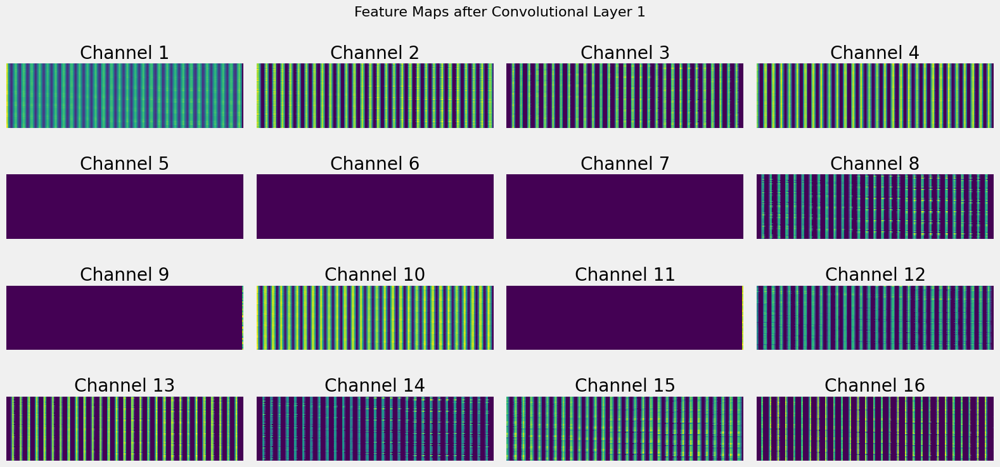

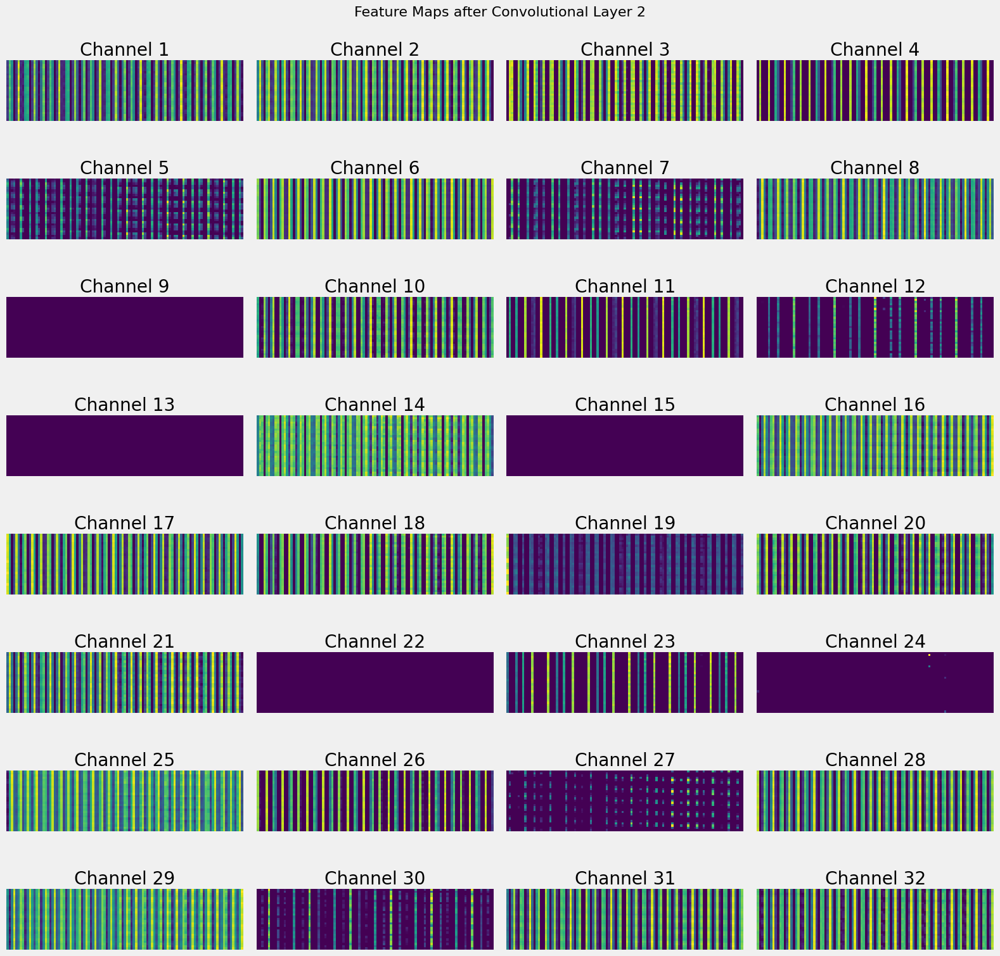

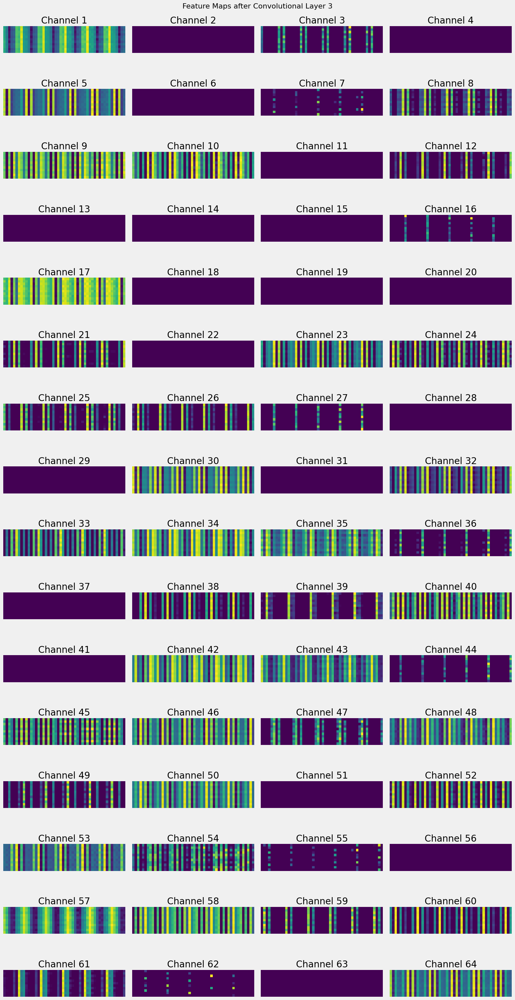

In [145]:
plot_feature_maps(rand_image)

# Visualisation after Each Layer of Deep CNN model

## Deep CNN Model (storing plots)

In [153]:
class DCNN_plot(nn.Module):
    def __init__(self):
        super().__init__()
        
        # input shape: 2, 60, 216
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=2, out_channels=24, kernel_size=(6,6), stride=(1,1), padding=0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 55, 211
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=24, kernel_size=(6,6), stride=(1,1), padding=0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 24, 50, 206
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=24, out_channels=48, kernel_size=(5,5), stride=(2,2), padding=0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 23, 101
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=48, kernel_size=(5,5), stride=(2,2), padding=0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 48, 10, 49
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=48, out_channels=64, kernel_size=(4,4), stride=(1,1), padding=0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 64, 7, 46
        self.conv6 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(4,4), stride=(1,1), padding=0),
            nn.ReLU(),
            nn.Dropout(0.2),
        )

        # input shape: 64, 4, 43
        self.connected_layer = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*4*43, 200),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(200, 5),
            nn.Softmax(dim=1),
        )

    def forward(self, input_data):
        input_data = input_data.to('cuda')

        feature_maps = []
        x = self.conv1(input_data)
        feature_maps.append(x.cpu().detach().numpy())

        x = self.conv2(x)
        feature_maps.append(x.cpu().detach().numpy())

        x = self.conv3(x)
        feature_maps.append(x.cpu().detach().numpy())

        x = self.conv4(x)
        feature_maps.append(x.cpu().detach().numpy())

        x = self.conv5(x)
        feature_maps.append(x.cpu().detach().numpy())

        x = self.conv6(x)
        feature_maps.append(x.cpu().detach().numpy())
        
        x = self.connected_layer(x)

        return x, feature_maps

## Plotting Function

In [156]:
def plot_feature_maps_deep(image):
    model = DCNN_plot().to('cuda')  # Move the model to CUDA (GPU)
    input_data = image
    input_data = input_data.reshape(1, 2, 216, 60)  
    input_data = torch.tensor(input_data, dtype=torch.float32).to('cuda')  # Move input data to CUDA (GPU)
    resize_transform = torch.nn.functional.interpolate
    input_data = resize_transform(input_data, size=(60, 216), mode='bicubic', align_corners=False)

    # Forward pass to get the output and feature maps
    output, feature_maps = model(input_data)

    # Visualize feature maps after each convolutional layer
    for i, fmap in enumerate(feature_maps, 1):
        num_channels = fmap.shape[1]
        num_cols = 4
        num_rows = (num_channels + num_cols - 1) // num_cols
        plt.figure(figsize=(16, 2*num_rows))  # Increase figsize for larger channel images
        for j in range(num_channels):  # Iterate over the number of output channels
            plt.subplot(num_rows, num_cols, j + 1)
            plt.imshow(fmap[0, j], cmap='viridis', interpolation='nearest')  # Display feature map for the first sample in the batch
            plt.title(f'Channel {j + 1}')
            plt.axis('off')
        plt.suptitle(f'Feature Maps after Convolutional Layer {i}', fontsize=16)
        plt.subplots_adjust(hspace=0, wspace=0)  # Adjust spacing between subplots
        plt.tight_layout()
        plt.show()

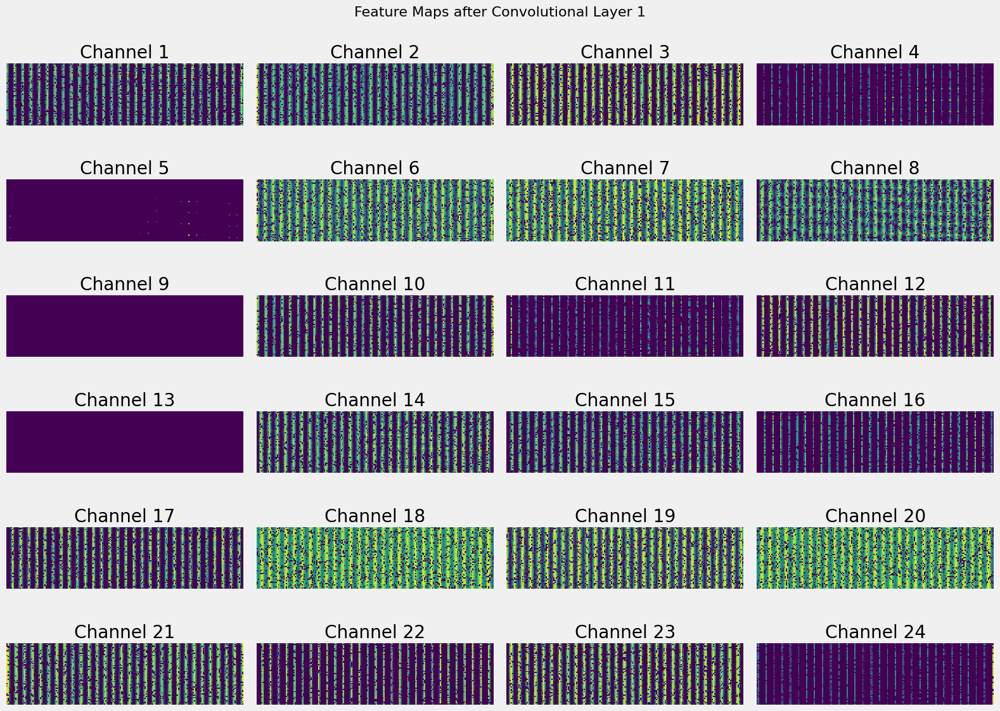

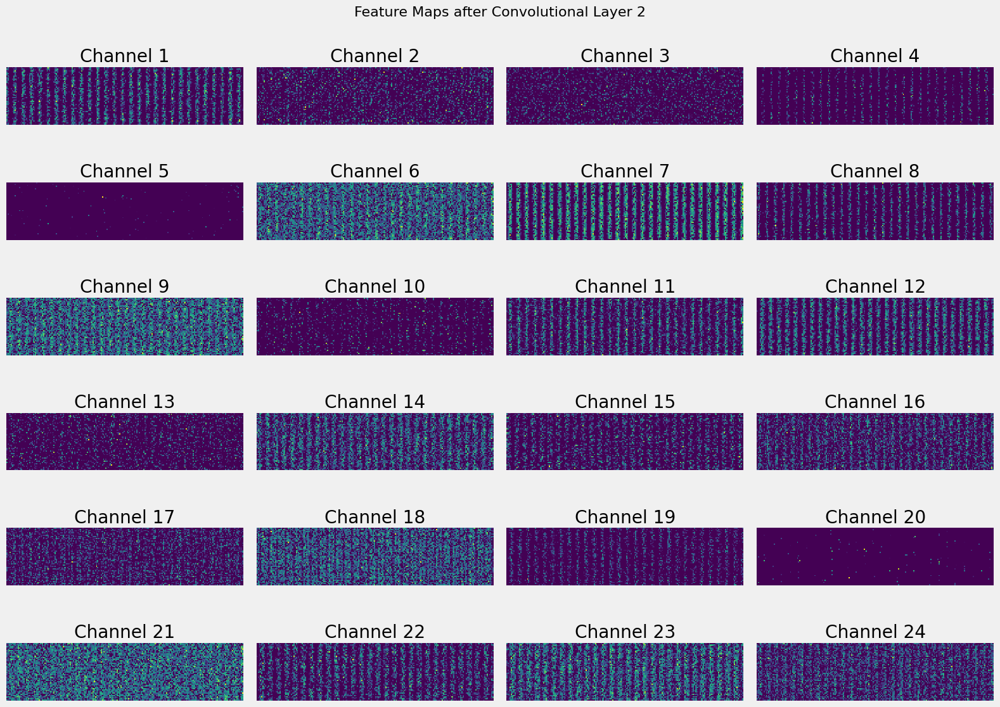

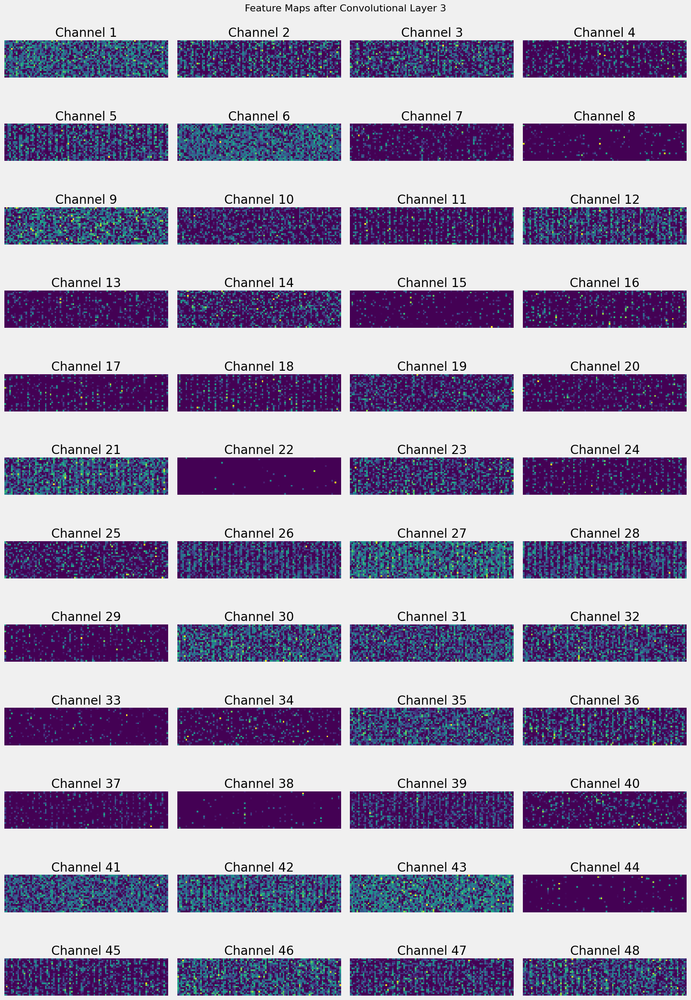

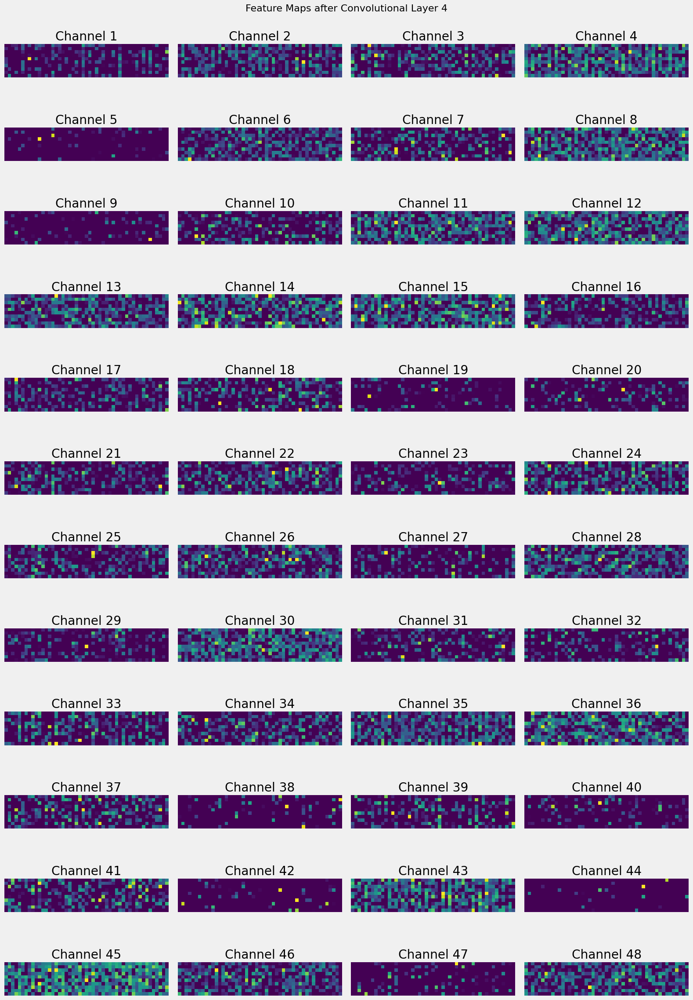

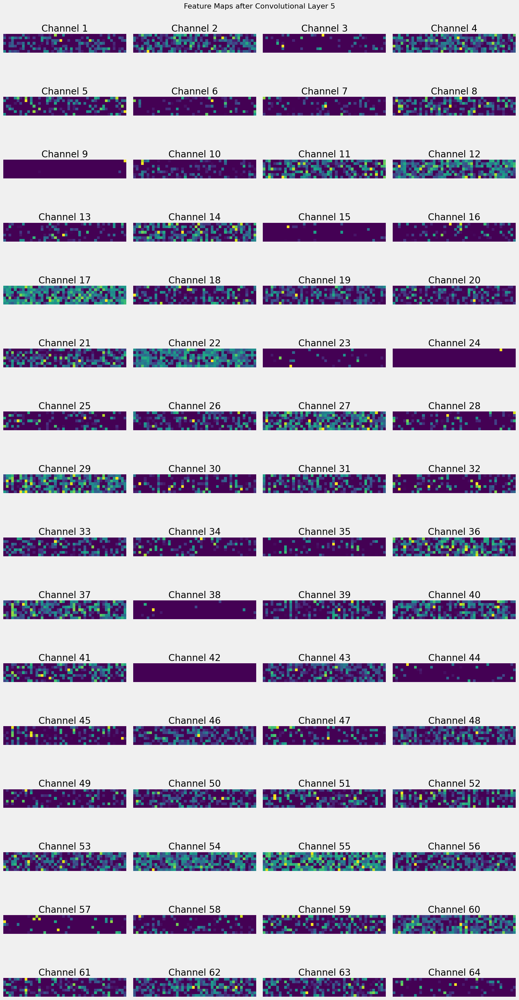

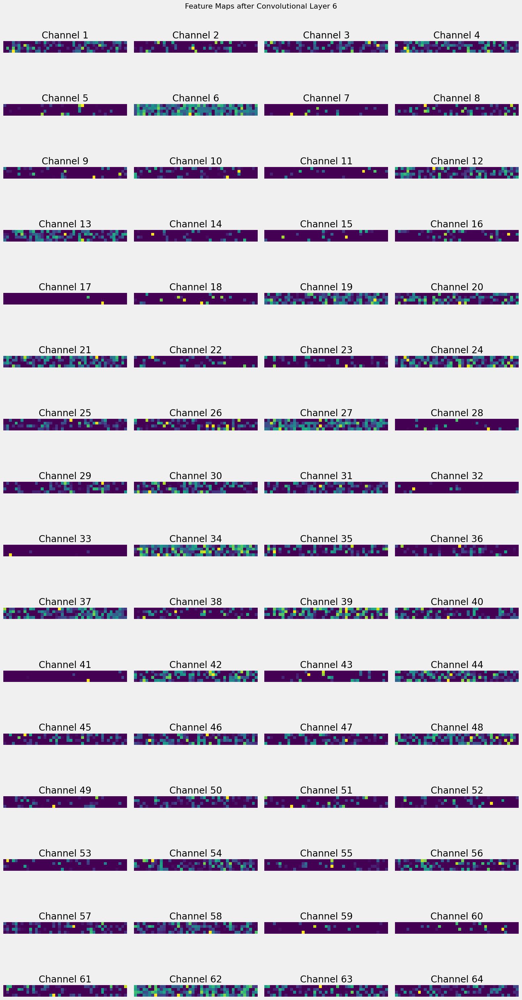

In [157]:
image = dataset['data'][0]

plot_feature_maps_deep(image)